In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import shap

In [2]:
# Load the dataset
df = pd.read_csv('updated_merged_df.csv')

# Display basic info
print(df.shape)

# Clean column names
df.columns = df.columns.str.strip()
print(df.columns)

df.head(10)

(978, 29)
Index(['Year', 'Country Name', 'Country Code',
       'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
       'Cause of death, by injury (% of total)',
       'Cause of death, by non-communicable diseases (% of total)',
       'Current health expenditure (% of GDP)',
       'Diabetes prevalence (% of population ages 20 to 79)',
       'Government expenditure on education, total (% of GDP)',
       'Income share held by highest 10%', 'Income share held by lowest 10%',
       'Income share held by second 20%',
       'Life expectancy at birth, total (years)',
       'Prevalence of undernourishment (% of population)',
       'Unemployment, total (% of total labor force) (modeled ILO estimate)',
       'population(in thousand)', 'all_causes(in thousand)',
       'diabetes_mellitus(in thousand)', '%death by diabetes',
       'alzheimer_and_other_dementia (in thousand)',
       '%death by alzheimer_and_other_dementia',
       

,Year,Country Name,Country Code,"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)",Current health expenditure (% of GDP),Diabetes prevalence (% of population ages 20 to 79),"Government expenditure on education, total (% of GDP)",Income share held by highest 10%,...,alzheimer_and_other_dementia (in thousand),%death by alzheimer_and_other_dementia,cardiovascular_diseases (in thousand),%death by cardiovascular_diseases,asthma (in thousand),%death by asthma,kidney_diseases (in thousand),%death by kidney_diseases,Income_share_bottom 40%,Income_share_top 10%
0,2000,Afghanistan,AFG,59.814650,8.175588,32.009763,9.443391,7.6,4.684761,NaN,...,0.925783,0.362498,43.481776,17.025641,2.712045,1.061923,3.038959,1.189929,14.731000,34.338001
1,2010,Afghanistan,AFG,48.149914,11.030924,40.819164,8.569672,7.6,3.479450,NaN,...,1.391584,0.555581,50.096831,20.000824,2.760920,1.102279,4.287169,1.711623,15.205000,33.824001
2,2015,Afghanistan,AFG,39.390981,16.389965,44.219053,10.105348,7.6,3.255800,NaN,...,1.727924,0.629098,55.987202,20.383674,2.753179,1.002370,5.218948,1.900101,15.131000,34.265999
3,2019,Afghanistan,AFG,32.930451,17.288464,49.781085,14.831320,7.6,4.343190,NaN,...,2.041364,0.700211,63.310264,21.716139,2.940604,1.008661,6.418009,2.201450,14.766000,34.903999
4,2020,Afghanistan,AFG,32.930451,17.288464,49.781085,15.533614,7.6,4.343190,NaN,...,2.158192,0.696604,67.264510,21.711096,3.042989,0.982191,6.869168,2.217175,14.766000,34.903999
5,2021,Afghanistan,AFG,32.930451,17.288464,49.781085,21.508461,10.9,4.343190,NaN,...,2.015189,0.591805,62.967290,18.491731,2.851603,0.837436,6.638959,1.949677,14.766000,34.903999
6,2000,Albania,ALB,8.109352,7.748300,84.142346,5.944198,2.8,3.430170,25.3,...,0.567182,2.753868,10.417629,50.581242,0.205188,0.996262,0.303569,1.473936,18.479000,26.025000
7,2010,Albania,ALB,3.259132,6.141521,90.599350,6.236677,2.8,3.413075,24.4,...,0.543696,2.672685,10.597010,52.092465,0.130051,0.639300,0.333480,1.639312,18.740999,25.917999
8,2015,Albania,ALB,2.955382,4.126815,92.917806,6.464119,2.8,3.437970,24.8,...,0.830900,3.462031,14.478437,60.325907,0.151627,0.631770,0.403571,1.681522,17.111000,26.794001
9,2019,Albania,ALB,3.023108,3.035996,93.940893,6.862141,2.8,3.916240,23.6,...,1.458058,4.330484,22.028507,65.425465,0.204107,0.606206,0.589707,1.751451,17.881001,25.577000


 **Data Types and Missing Values**

In [3]:
# Check data types
df.dtypes

# Check missing values
df.isnull().sum().sort_values(ascending=False)


,0
Income share held by lowest 10%,132
Income share held by second 20%,132
Income share held by highest 10%,132
Prevalence of undernourishment (% of population),84
"Government expenditure on education, total (% of GDP)",30
"Unemployment, total (% of total labor force) (modeled ILO estimate)",24
Current health expenditure (% of GDP),6
"Cause of death, by non-communicable diseases (% of total)",6
"Cause of death, by injury (% of total)",6
"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)",6


In [4]:
df.drop(columns=['Income share held by lowest 10%', 'Income share held by second 20%','Income share held by highest 10%'], inplace=True)

**Handling Missing Values**

In [5]:

def impute_by_inequality(df, target_cols, top10_col, bottom40_col):
    """
    Imputes missing values in specified target columns using inequality-based group means.

    Parameters:
    - df: The DataFrame
    - target_cols: list of column names to impute
    - top10_col: name of column for income share of top 10%
    - bottom40_col: name of column for income share of bottom 40%

    Returns:
    - DataFrame with imputed values and flags
    """

    # Step 1: Create Palma Ratio and Inequality Groups
    df = df.copy()
    df['Palma Ratio'] = df[top10_col] / df[bottom40_col]

    # Remove inf or nan in Palma Ratio for binning
    df['Palma Ratio'] = df['Palma Ratio'].replace([np.inf, -np.inf], np.nan)
    df['Inequality Group'] = pd.qcut(df['Palma Ratio'], q=3, labels=['Low', 'Medium', 'High'])

    for col in target_cols:
        impute_flag = f'{col}_imputed'
        df[impute_flag] = df[col].isna()

        # Group-wise imputation
        df[col] = df.groupby('Inequality Group')[col].transform(
            lambda x: x.fillna(x.mean())
        )

    return df


In [6]:
target_columns = [
    'Prevalence of undernourishment (% of population)',
    'Government expenditure on education, total (% of GDP)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)',
    'Current health expenditure (% of GDP)','Cause of death, by non-communicable diseases (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)'
]

df = impute_by_inequality(
    df=df,
    target_cols=target_columns,
    top10_col='Income_share_top 10%',
    bottom40_col='Income_share_bottom 40%'
)


/tmp/ipython-input-5-875398277.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df[col] = df.groupby('Inequality Group')[col].transform(
/tmp/ipython-input-5-875398277.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df[col] = df.groupby('Inequality Group')[col].transform(
/tmp/ipython-input-5-875398277.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df[col] = df.groupby('Inequality Group')[col].transform(
/

**Summary Statistics**

In [7]:
df.describe()

,Year,"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)","Cause of death, by injury (% of total)","Cause of death, by non-communicable diseases (% of total)",Current health expenditure (% of GDP),Diabetes prevalence (% of population ages 20 to 79),"Government expenditure on education, total (% of GDP)","Life expectancy at birth, total (years)",Prevalence of undernourishment (% of population),"Unemployment, total (% of total labor force) (modeled ILO estimate)",...,%death by alzheimer_and_other_dementia,cardiovascular_diseases (in thousand),%death by cardiovascular_diseases,asthma (in thousand),%death by asthma,kidney_diseases (in thousand),%death by kidney_diseases,Income_share_bottom 40%,Income_share_top 10%,Palma Ratio
count,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,...,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000,978.000000
mean,2014.166667,22.949486,8.743004,68.307510,6.486120,7.893763,4.391030,70.641629,10.622266,7.964351,...,2.161787,100.735059,29.065832,2.372753,0.599190,6.434340,2.612268,15.187550,33.844832,2.744241
std,7.338980,21.070974,4.647490,22.197218,2.884026,4.342922,1.864616,8.765818,10.694257,5.879768,...,2.591925,414.243434,13.350603,14.847043,0.526851,20.277930,1.681155,4.720260,8.572393,1.870226
min,2000.000000,1.208531,2.374387,16.009386,1.107200,0.000000,0.358479,31.530000,2.500000,0.100000,...,0.009434,0.148974,3.713213,0.000580,0.003447,0.011296,0.026483,4.110000,16.662001,0.545347
25%,2010.000000,6.359510,5.759299,47.321301,4.309472,5.100000,3.198852,65.087250,2.500000,3.992500,...,0.537188,4.543744,19.290843,0.060348,0.200343,0.325713,1.428239,11.547250,26.313000,1.391077
50%,2017.000000,13.206733,8.026034,75.645714,6.042479,7.100000,4.208105,72.108500,6.200000,6.255500,...,1.198530,15.200846,28.428047,0.205437,0.468528,1.341936,2.132393,15.335000,32.823002,2.123010
75%,2020.000000,41.214963,10.499229,87.276103,8.371716,9.500000,5.365145,77.197000,15.775000,10.590750,...,2.431445,50.580497,36.914256,0.940404,0.851371,3.906685,3.388991,18.818001,40.662999,3.514421
max,2021.000000,78.637109,73.428775,96.131871,21.969868,30.800000,14.195160,84.560000,71.400000,34.153000,...,13.372274,5035.553683,72.384113,205.948280,4.556264,206.362184,10.920282,30.552999,62.214001,15.137226


In [8]:
df_wb = pd.read_excel('World_Economy.xlsx')


In [9]:
df_wb.columns = df_wb.columns.str.strip()
print(df_wb.columns.tolist())


['Country Name', 'Code', 'Region', 'Income group']


In [10]:
df_new = df.merge(df_wb[['Country Name', 'Region', 'Income group']],
                     on='Country Name',
                     how='left')

In [11]:
# Check missing values
df_new.isnull().sum().sort_values(ascending=False)

,0
Region,18
Income group,18
Country Code,0
Country Name,0
Year,0
"Cause of death, by injury (% of total)",0
"Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)",0
"Cause of death, by non-communicable diseases (% of total)",0
Current health expenditure (% of GDP),0
"Life expectancy at birth, total (years)",0


In [12]:
df_new[df_new['Region'].isnull() | df_new['Income group'].isnull()]['Country Name'].unique()


array(['Sao Tome and Principe', 'United States of America', 'Viet Nam'],
      dtype=object)

In [13]:
# Manually fill Region and Income group for Viet Nam
df_new.loc[df_new['Country Name'] == 'Viet Nam', 'Region'] = 'East Asia & Pacific'
df_new.loc[df_new['Country Name'] == 'Viet Nam', 'Income group'] = 'Lower middle income'

# Manually fill Region and Income group for Sao Tome and Principe
df_new.loc[df_new['Country Name'] == 'Sao Tome and Principe', 'Region'] = 'Sub-Saharan Africa'
df_new.loc[df_new['Country Name'] == 'Sao Tome and Principe', 'Income group'] = 'Lower middle income'

# Manually fill Region and Income group for United States of America
df_new.loc[df_new['Country Name'] == 'United States of America', 'Region'] = 'North America'
df_new.loc[df_new['Country Name'] == 'United States of America', 'Income group'] = 'High income'



In [14]:
df_new[df_new['Region'].isnull() | df_new['Income group'].isnull()]['Country Name'].unique()

array([], dtype=object)

In [15]:
print(df_new.columns.tolist())

['Year', 'Country Name', 'Country Code', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)', 'Cause of death, by injury (% of total)', 'Cause of death, by non-communicable diseases (% of total)', 'Current health expenditure (% of GDP)', 'Diabetes prevalence (% of population ages 20 to 79)', 'Government expenditure on education, total (% of GDP)', 'Life expectancy at birth, total (years)', 'Prevalence of undernourishment (% of population)', 'Unemployment, total (% of total labor force) (modeled ILO estimate)', 'population(in thousand)', 'all_causes(in thousand)', 'diabetes_mellitus(in thousand)', '%death by diabetes', 'alzheimer_and_other_dementia (in thousand)', '%death by alzheimer_and_other_dementia', 'cardiovascular_diseases (in thousand)', '%death by cardiovascular_diseases', 'asthma (in thousand)', '%death by asthma', 'kidney_diseases (in thousand)', '%death by kidney_diseases', 'Income_share_bottom 40%', 'Income_share_top 10%',

**Exploratory Data Analysis**

**Global Trends in Life Expectancy and Chronic Disease Mortality Rates**

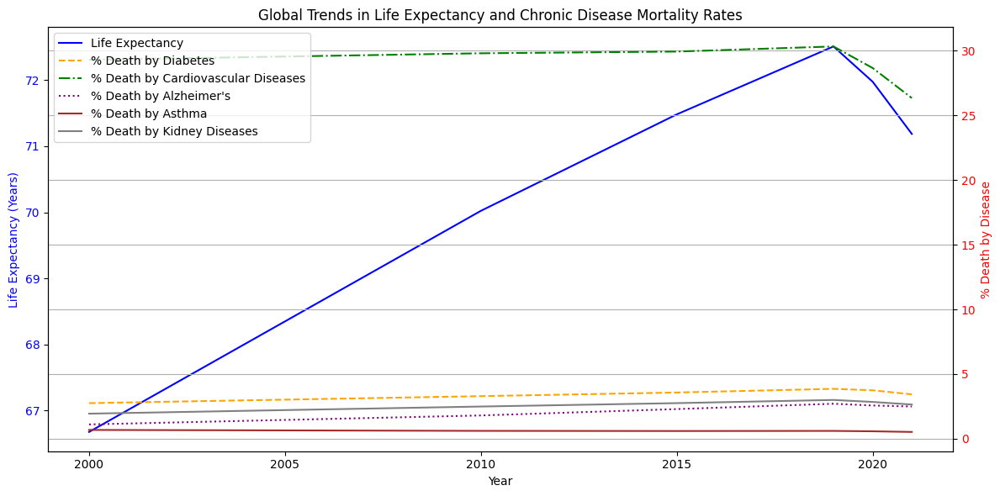

In [16]:
# Group by Year and calculate the mean for all numeric columns
yearly =df.groupby('Year').mean(numeric_only=True)

cols_of_interest = [
    'Life expectancy at birth, total (years)',
    '%death by diabetes',
    '%death by cardiovascular_diseases',
    '%death by alzheimer_and_other_dementia',
    '%death by asthma',
    '%death by kidney_diseases'
]

yearly = df.groupby('Year')[cols_of_interest].mean()


# Create figure and axis
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot Life Expectancy on left y-axis
ax1.set_title('Global Trends in Life Expectancy and Chronic Disease Mortality Rates')
ax1.set_xlabel('Year')
ax1.set_ylabel('Life Expectancy (Years)', color='blue')
ax1.plot(yearly.index, yearly['Life expectancy at birth, total (years)'], color='blue', label='Life Expectancy')
ax1.tick_params(axis='y', labelcolor='blue')

# Create right y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('% Death by Disease', color='red')
ax2.plot(yearly.index, yearly['%death by diabetes'], label='% Death by Diabetes', linestyle='--', color='orange')
ax2.plot(yearly.index, yearly['%death by cardiovascular_diseases'], label='% Death by Cardiovascular Diseases', linestyle='-.', color='green')
ax2.plot(yearly.index, yearly['%death by alzheimer_and_other_dementia'], label="% Death by Alzheimer's", linestyle=':', color='purple')
ax2.plot(yearly.index, yearly['%death by asthma'], label='% Death by Asthma', linestyle='-', color='brown')
ax2.plot(yearly.index, yearly['%death by kidney_diseases'], label='% Death by Kidney Diseases', linestyle='-', color='grey')
ax2.tick_params(axis='y', labelcolor='red')

# Combine legends
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax2.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

# Grid and layout
plt.grid(True)
fig.tight_layout()
plt.show()



**Correlation between % Death by Disease and SDoHs**

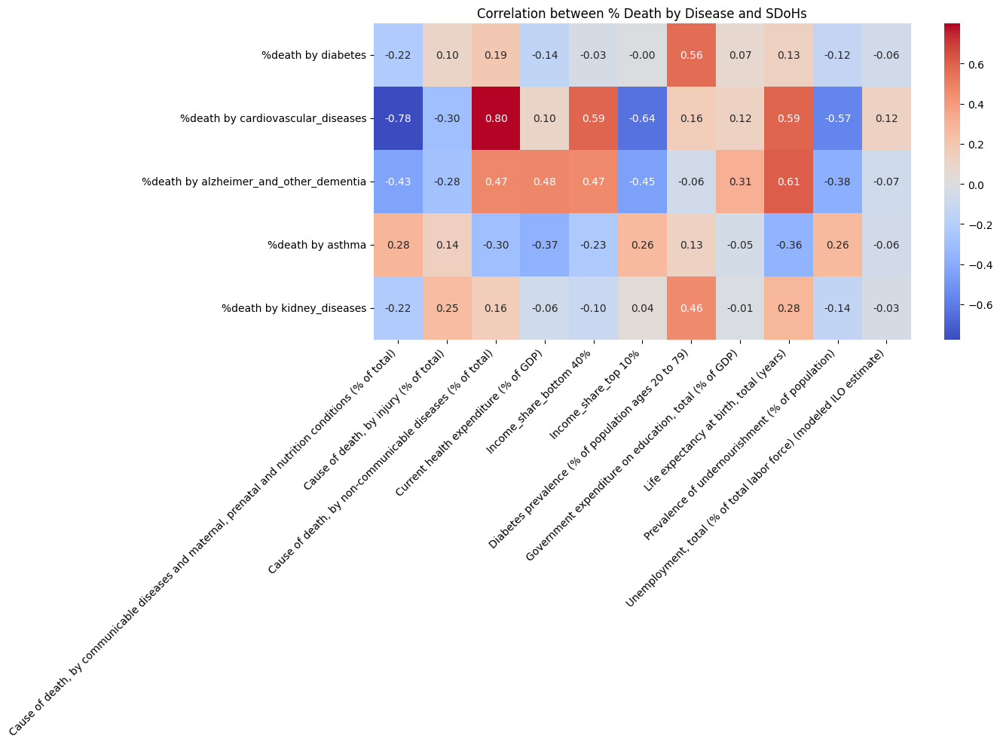

In [17]:
# Select target outcome columns
target_cols = [
    '%death by diabetes',
    '%death by cardiovascular_diseases',
    '%death by alzheimer_and_other_dementia',
    '%death by asthma',
    '%death by kidney_diseases'
]

# Select SDoH feature columns
sdoh_cols = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)',

]

# Compute correlation
corr_df = df[target_cols + sdoh_cols].corr()

# Visualize the correlation matrix

plt.figure(figsize=(14, 10))
sns.heatmap(corr_df.loc[target_cols, sdoh_cols], annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation between % Death by Disease and SDoHs')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


**Global Trends of Social Determinants of Health Over Time**

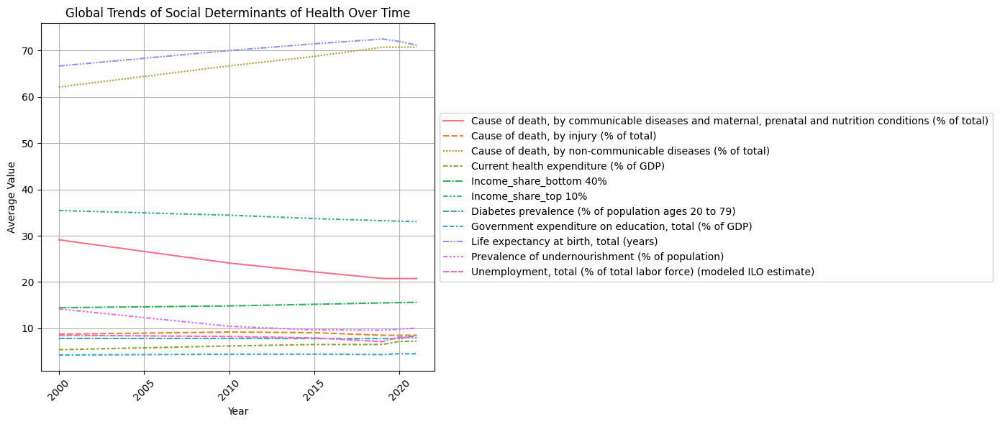

In [18]:
# List of SDoHs
sdoh_cols = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)',

]

# Global average per year
global_sdoh_trend = df.groupby('Year')[sdoh_cols].mean()

# Plot
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(14, 6))
sns.lineplot(data=global_sdoh_trend)
plt.title('Global Trends of Social Determinants of Health Over Time')
plt.ylabel('Average Value')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()


**Mortality by Chronic Disease across  Income Groups & Regions**

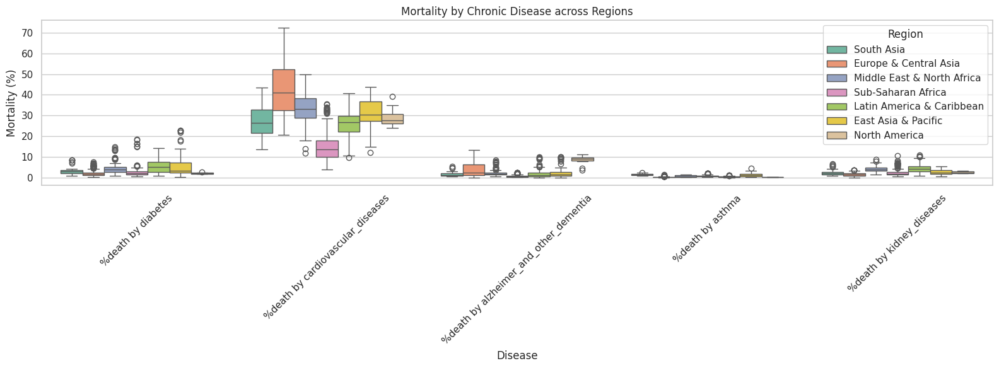

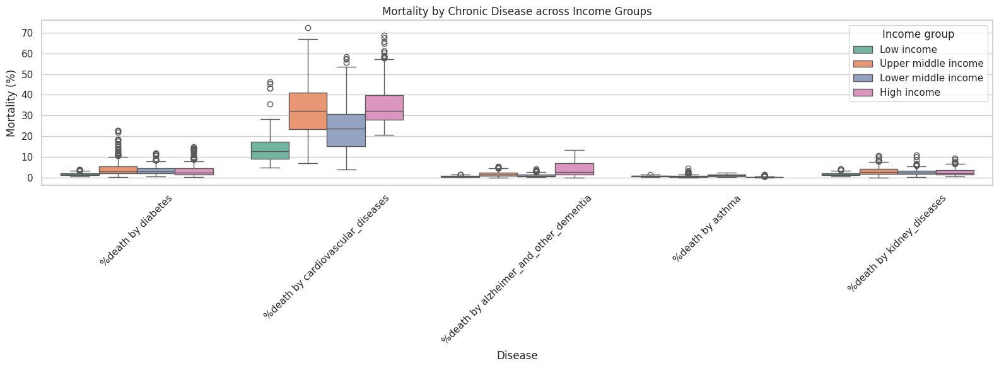

In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set a clean style
sns.set(style="whitegrid", palette="Set2")

#  Boxplots of % Death by Disease across Region and Income Group

# List of chronic diseases of interest
mortality_cols = [
    '%death by diabetes',
    '%death by cardiovascular_diseases',
    '%death by alzheimer_and_other_dementia',
    '%death by asthma',
    '%death by kidney_diseases'
]

# Melt for boxplot
df_mortality_region = df_new.melt(
    id_vars=['Region'],
    value_vars=mortality_cols,
    var_name='Disease',
    value_name='Mortality (%)'
)

df_mortality_income = df_new.melt(
    id_vars=['Income group'],
    value_vars=mortality_cols,
    var_name='Disease',
    value_name='Mortality (%)'
)

# Plot by Region
plt.figure(figsize=(16, 6))
sns.boxplot(data=df_mortality_region, x='Disease', y='Mortality (%)', hue='Region')
plt.title('Mortality by Chronic Disease across Regions')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot by Income Group
plt.figure(figsize=(16, 6))
sns.boxplot(data=df_mortality_income, x='Disease', y='Mortality (%)', hue='Income group')
plt.title('Mortality by Chronic Disease across Income Groups')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



**SHAP for SDoH Importance**

**a. %death by diabetes**

/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


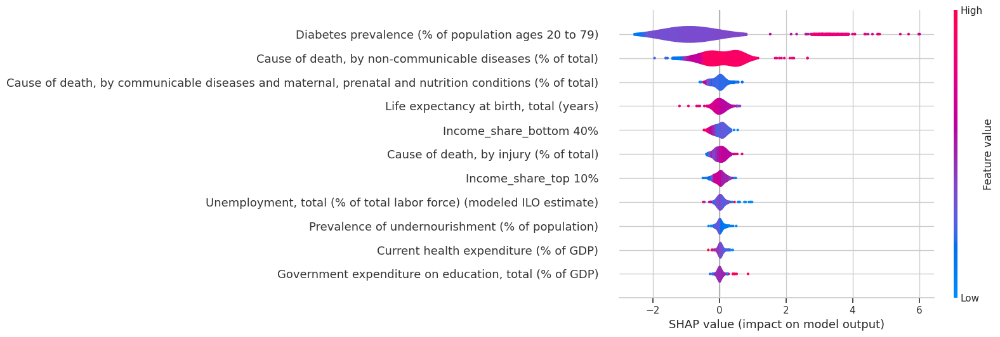

In [20]:
# Define target
target = '%death by diabetes'
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Split the data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# SHAP on test set
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot
#shap.summary_plot(shap_values, features=X_test, feature_names=features)
shap.summary_plot(shap_values,plot_type='violin')


In [21]:
# Compute mean SHAP values
mean_abs_shap = pd.DataFrame({
    'Feature': features,
    'Mean |SHAP value|': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean |SHAP value|', ascending=False)
print(mean_abs_shap)

                                              Feature  Mean |SHAP value|
6   Diabetes prevalence (% of population ages 20 t...           1.430321
2   Cause of death, by non-communicable diseases (...           0.571708
0   Cause of death, by communicable diseases and m...           0.175079
8             Life expectancy at birth, total (years)           0.161026
4                             Income_share_bottom 40%           0.156745
1              Cause of death, by injury (% of total)           0.149209
5                                Income_share_top 10%           0.136419
10  Unemployment, total (% of total labor force) (...           0.121970
9    Prevalence of undernourishment (% of population)           0.087236
3               Current health expenditure (% of GDP)           0.075292
7   Government expenditure on education, total (% ...           0.071368


In [22]:
diabetes_top_5 = mean_abs_shap.head(5)
diabetes_top_5

,Feature,Mean |SHAP value|
6,Diabetes prevalence (% of population ages 20 t...,1.430321
2,"Cause of death, by non-communicable diseases (...",0.571708
0,"Cause of death, by communicable diseases and m...",0.175079
8,"Life expectancy at birth, total (years)",0.161026
4,Income_share_bottom 40%,0.156745


**b. %death by cardiovascular_diseases**

/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


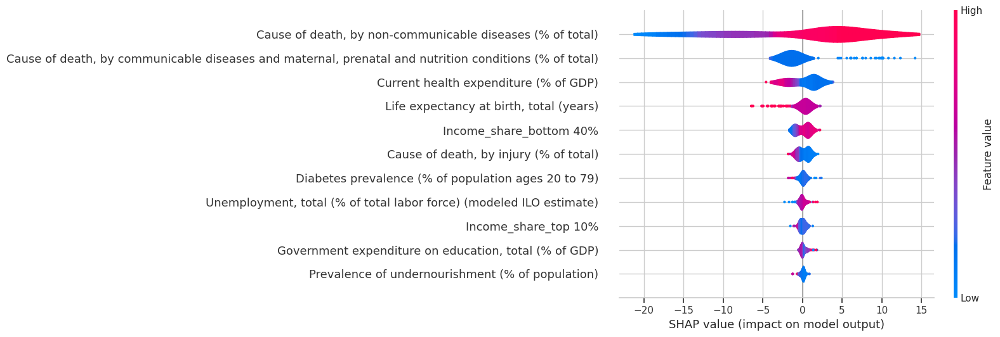

In [23]:
# Define target and features
target = '%death by cardiovascular_diseases'
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Split the data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# SHAP on test set
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot
#shap.summary_plot(shap_values, features=X_test, feature_names=features)
shap.summary_plot(shap_values,plot_type='violin')

In [24]:
# Compute mean SHAP values
mean_abs_shap = pd.DataFrame({
    'Feature': features,
    'Mean |SHAP value|': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean |SHAP value|', ascending=False)
print(mean_abs_shap)


                                              Feature  Mean |SHAP value|
2   Cause of death, by non-communicable diseases (...           7.713171
0   Cause of death, by communicable diseases and m...           2.508578
3               Current health expenditure (% of GDP)           1.706992
8             Life expectancy at birth, total (years)           1.053226
4                             Income_share_bottom 40%           0.809082
1              Cause of death, by injury (% of total)           0.678320
6   Diabetes prevalence (% of population ages 20 t...           0.401011
10  Unemployment, total (% of total labor force) (...           0.338377
5                                Income_share_top 10%           0.322957
7   Government expenditure on education, total (% ...           0.277774
9    Prevalence of undernourishment (% of population)           0.215168


In [25]:
cardiovascular_top_5 = mean_abs_shap.head(5)
cardiovascular_top_5

,Feature,Mean |SHAP value|
2,"Cause of death, by non-communicable diseases (...",7.713171
0,"Cause of death, by communicable diseases and m...",2.508578
3,Current health expenditure (% of GDP),1.706992
8,"Life expectancy at birth, total (years)",1.053226
4,Income_share_bottom 40%,0.809082


**%death by alzheimer_and_other_dementia**


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


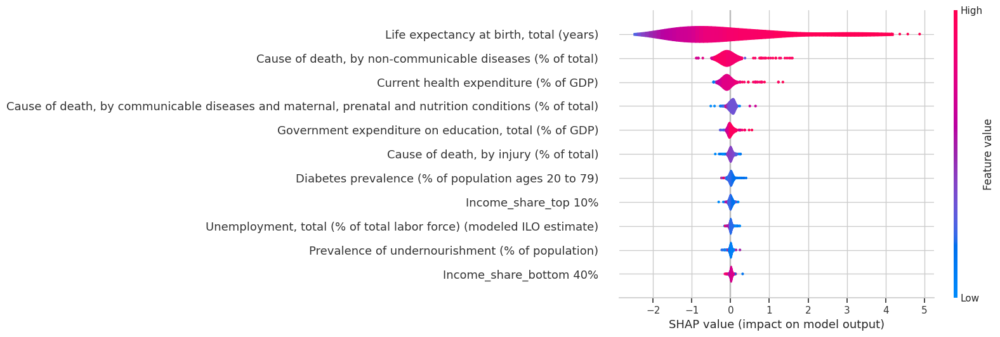

In [26]:
# Define target and features
target = '%death by alzheimer_and_other_dementia'
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Split the data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# SHAP on test set
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test)

# Plot
#shap.summary_plot(shap_values, features=X_test, feature_names=features)
shap.summary_plot(shap_values,plot_type='violin')

In [27]:
# Compute mean SHAP values
mean_abs_shap = pd.DataFrame({
    'Feature': features,
    'Mean |SHAP value|': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean |SHAP value|', ascending=False)
print(mean_abs_shap)

                                              Feature  Mean |SHAP value|
8             Life expectancy at birth, total (years)           1.262810
2   Cause of death, by non-communicable diseases (...           0.267747
3               Current health expenditure (% of GDP)           0.194377
0   Cause of death, by communicable diseases and m...           0.078213
7   Government expenditure on education, total (% ...           0.071961
1              Cause of death, by injury (% of total)           0.063589
6   Diabetes prevalence (% of population ages 20 t...           0.059720
5                                Income_share_top 10%           0.043197
10  Unemployment, total (% of total labor force) (...           0.033368
9    Prevalence of undernourishment (% of population)           0.032209
4                             Income_share_bottom 40%           0.031448


In [28]:
alzheimer_top_5 = mean_abs_shap.head(5)
alzheimer_top_5

,Feature,Mean |SHAP value|
8,"Life expectancy at birth, total (years)",1.262810
2,"Cause of death, by non-communicable diseases (...",0.267747
3,Current health expenditure (% of GDP),0.194377
0,"Cause of death, by communicable diseases and m...",0.078213
7,"Government expenditure on education, total (% ...",0.071961


**%death by asthma**


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


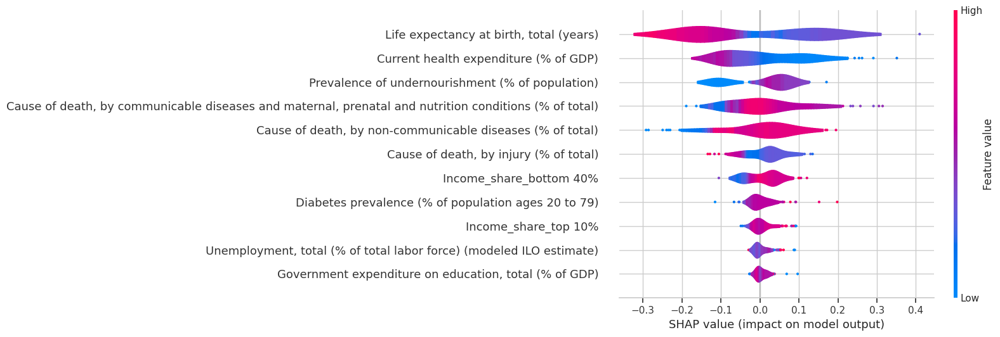

In [32]:
# Define target and features
target = '%death by asthma'
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Split the data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# SHAP on test set
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test,check_additivity=False)

# Plot
#shap.summary_plot(shap_values, features=X_test, feature_names=features)
shap.summary_plot(shap_values,plot_type='violin')

In [33]:
# Compute mean SHAP values
mean_abs_shap = pd.DataFrame({
    'Feature': features,
    'Mean |SHAP value|': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean |SHAP value|', ascending=False)
print(mean_abs_shap)

                                              Feature  Mean |SHAP value|
8             Life expectancy at birth, total (years)           0.153026
3               Current health expenditure (% of GDP)           0.085375
9    Prevalence of undernourishment (% of population)           0.071964
0   Cause of death, by communicable diseases and m...           0.071540
2   Cause of death, by non-communicable diseases (...           0.070582
1              Cause of death, by injury (% of total)           0.041856
4                             Income_share_bottom 40%           0.038309
6   Diabetes prevalence (% of population ages 20 t...           0.021206
5                                Income_share_top 10%           0.018358
10  Unemployment, total (% of total labor force) (...           0.014461
7   Government expenditure on education, total (% ...           0.011364


In [35]:
asthma_top_5 = mean_abs_shap.head(5)
asthma_top_5

,Feature,Mean |SHAP value|
8,"Life expectancy at birth, total (years)",0.153026
3,Current health expenditure (% of GDP),0.085375
9,Prevalence of undernourishment (% of population),0.071964
0,"Cause of death, by communicable diseases and m...",0.071540
2,"Cause of death, by non-communicable diseases (...",0.070582


**%death by kidney_diseases**

/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


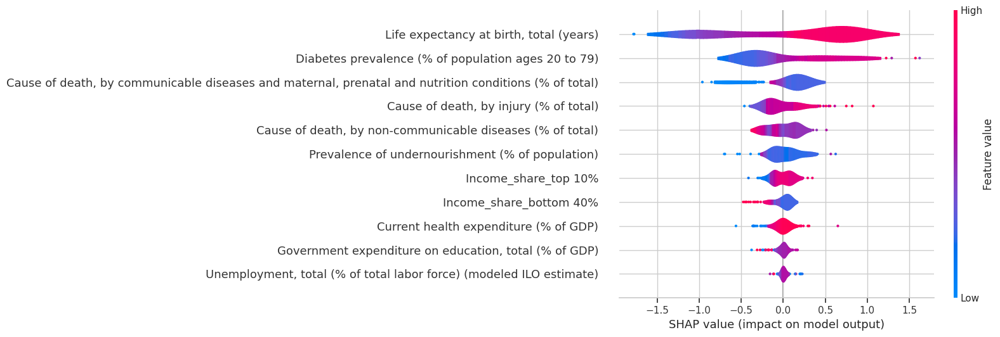

In [37]:
# Define target and features
target = '%death by kidney_diseases'
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Split the data
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# SHAP on test set
explainer = shap.Explainer(model, X_train)
shap_values = explainer(X_test, check_additivity=False)

# Plot
#shap.summary_plot(shap_values, features=X_test, feature_names=features)
shap.summary_plot(shap_values,plot_type='violin')

In [38]:
# Compute mean SHAP values
mean_abs_shap = pd.DataFrame({
    'Feature': features,
    'Mean |SHAP value|': np.abs(shap_values.values).mean(axis=0)
}).sort_values(by='Mean |SHAP value|', ascending=False)
print(mean_abs_shap)

                                              Feature  Mean |SHAP value|
8             Life expectancy at birth, total (years)           0.736135
6   Diabetes prevalence (% of population ages 20 t...           0.447599
0   Cause of death, by communicable diseases and m...           0.271950
1              Cause of death, by injury (% of total)           0.189913
2   Cause of death, by non-communicable diseases (...           0.152184
9    Prevalence of undernourishment (% of population)           0.143509
5                                Income_share_top 10%           0.104672
4                             Income_share_bottom 40%           0.092289
3               Current health expenditure (% of GDP)           0.082624
7   Government expenditure on education, total (% ...           0.046053
10  Unemployment, total (% of total labor force) (...           0.029509


In [39]:
kidney_diseases_top_5 = mean_abs_shap.head(5)
kidney_diseases_top_5

,Feature,Mean |SHAP value|
8,"Life expectancy at birth, total (years)",0.736135
6,Diabetes prevalence (% of population ages 20 t...,0.447599
0,"Cause of death, by communicable diseases and m...",0.271950
1,"Cause of death, by injury (% of total)",0.189913
2,"Cause of death, by non-communicable diseases (...",0.152184


In [40]:
import pandas as pd

diabetes_top_5 = [
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Life expectancy at birth, total (years)',
    'Income_share_bottom 40%',
    'Income_share_top 10%'
]

cardiovascular_top_5 = [
    'Cause of death, by non-communicable diseases (% of total)',
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Current health expenditure (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Income_share_bottom 40%'
]

alzheimer_top_5 = [
    'Life expectancy at birth, total (years)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Government expenditure on education, total (% of GDP)',
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)'
]

asthma_top_5 = [
    'Life expectancy at birth, total (years)',
    'Current health expenditure (% of GDP)',
    'Prevalence of undernourishment (% of population)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)'
]

kidney_diseases_top_5 = [
    'Life expectancy at birth, total (years)',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Cause of death, by injury (% of total)'
]

# Combine into a DataFrame
combined_df = pd.DataFrame({
    'Diabetes': diabetes_top_5,
    'Cardiovascular Diseases': cardiovascular_top_5,
    'Alzheimer’s & Dementias': alzheimer_top_5,
    'Asthma': asthma_top_5,
    'Kidney Diseases': kidney_diseases_top_5
})

print(combined_df)



                                            Diabetes  \
0  Diabetes prevalence (% of population ages 20 t...   
1  Cause of death, by non-communicable diseases (...   
2            Life expectancy at birth, total (years)   
3                            Income_share_bottom 40%   
4                               Income_share_top 10%   

                             Cardiovascular Diseases  \
0  Cause of death, by non-communicable diseases (...   
1  Cause of death, by communicable diseases and m...   
2              Current health expenditure (% of GDP)   
3            Life expectancy at birth, total (years)   
4                            Income_share_bottom 40%   

                             Alzheimer’s & Dementias  \
0            Life expectancy at birth, total (years)   
1  Cause of death, by non-communicable diseases (...   
2              Current health expenditure (% of GDP)   
3  Government expenditure on education, total (% ...   
4  Cause of death, by communicable diseases an

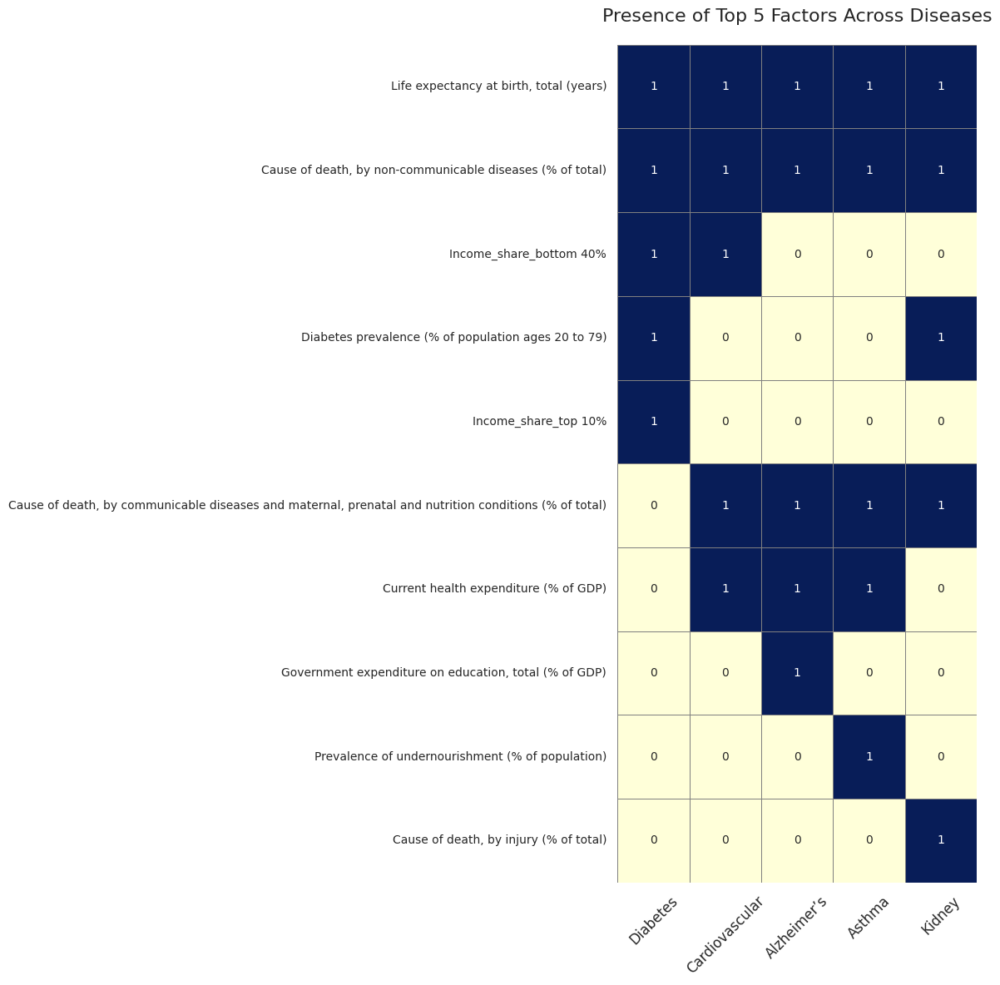

In [41]:
# Heatmap to compare SoDHs
diabetes_top_5 = ['Diabetes prevalence (% of population ages 20 to 79)', 'Cause of death, by non-communicable diseases (% of total)',
                  'Life expectancy at birth, total (years)', 'Income_share_bottom 40%', 'Income_share_top 10%']
cardiovascular_top_5 = ['Cause of death, by non-communicable diseases (% of total)', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
                'Current health expenditure (% of GDP)', 'Life expectancy at birth, total (years)', 'Income_share_bottom 40%']
alzheimer_top_5 = ['Life expectancy at birth, total (years)', 'Cause of death, by non-communicable diseases (% of total)', 'Current health expenditure (% of GDP)',
                   'Government expenditure on education, total (% of GDP)', 'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)']
asthma_top_5 = ['Life expectancy at birth, total (years)', 'Current health expenditure (% of GDP)',
                'Prevalence of undernourishment (% of population)',
                'Cause of death, by non-communicable diseases (% of total)',
                'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)']
kidney_diseases_top_5 = ['Life expectancy at birth, total (years)', 'Diabetes prevalence (% of population ages 20 to 79)',
                         'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
                         'Cause of death, by non-communicable diseases (% of total)', 'Cause of death, by injury (% of total)']

# Unique factor list
factor_list = list(set(
    diabetes_top_5 + cardiovascular_top_5 + alzheimer_top_5 + asthma_top_5 + kidney_diseases_top_5
))

# Initialize heatmap DataFrame
heatmap_df = pd.DataFrame(0, index=factor_list, columns=[
    "Diabetes", "Cardiovascular", "Alzheimer’s", "Asthma", "Kidney"
])

for factor in factor_list:
    if factor in diabetes_top_5:
        heatmap_df.loc[factor, "Diabetes"] = 1
    if factor in cardiovascular_top_5:
        heatmap_df.loc[factor, "Cardiovascular"] = 1
    if factor in alzheimer_top_5:
        heatmap_df.loc[factor, "Alzheimer’s"] = 1
    if factor in asthma_top_5:
        heatmap_df.loc[factor, "Asthma"] = 1
    if factor in kidney_diseases_top_5:
        heatmap_df.loc[factor, "Kidney"] = 1

# Sort rows to cluster similar indicators together
heatmap_df = heatmap_df.sort_values(by=list(heatmap_df.columns), ascending=False)

# Plot
plt.figure(figsize=(12, 12))
sns.heatmap(heatmap_df, cmap="YlGnBu", linewidths=0.5, linecolor="gray", annot=True, fmt="d",
            cbar=False, square=False, annot_kws={"size": 10})

plt.xticks(fontsize=12, rotation=45)
plt.yticks(fontsize=10)
plt.title("Presence of Top 5 Factors Across Diseases", fontsize=16, pad=20)
plt.tight_layout()
plt.show()


**Mortality by Chronic Disease across Income Groups**

In [42]:
# SHAP for Income group-wise analysis
all_results = []
def shap_analysis_by_group(df, group_col, target_col, feature_cols, disease_name):
    groups = df[group_col].dropna().unique()

    for group in groups:
        subset = df[df[group_col] == group]

        # Ensure enough data
        if len(subset) < 50:
            print(f"Skipping {group} ({len(subset)} rows)")
            continue

        X = subset[feature_cols]
        y = subset[target_col]

        if X.isnull().any().any() or y.isnull().any():
            print(f"Missing data in group {group}, skipping...")
            continue

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        model = RandomForestRegressor(n_estimators=100, random_state=42)
        model.fit(X_train, y_train)

        explainer = shap.TreeExplainer(model, X_train)
        shap_values = explainer(X_test, check_additivity=False)



        #  Violin-style SHAP summary plot
        print(f"SHAP summary (violin) for {disease_name} in {group_col} = {group}")
        shap.summary_plot(shap_values, features=X_test, feature_names=feature_cols, plot_type='violin', show=True)


        #  Inspect SHAP values numerically
        mean_shap = pd.DataFrame({
            'Feature': feature_cols,
            'Mean |SHAP|': np.abs(shap_values.values).mean(axis=0)
        }).sort_values(by='Mean |SHAP|', ascending=False)

        print(f'\nTop 5 SDoH for {disease_name} in {group_col} = {group}:')
        print(mean_shap.head(5))

        plt.close()  # Close plot to avoid overlaps in loops

        mean_shap['Disease'] = disease_name
        mean_shap['Group'] = group
        all_results.append(mean_shap)

SHAP summary (violin) for Diabetes in Income group = Low income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


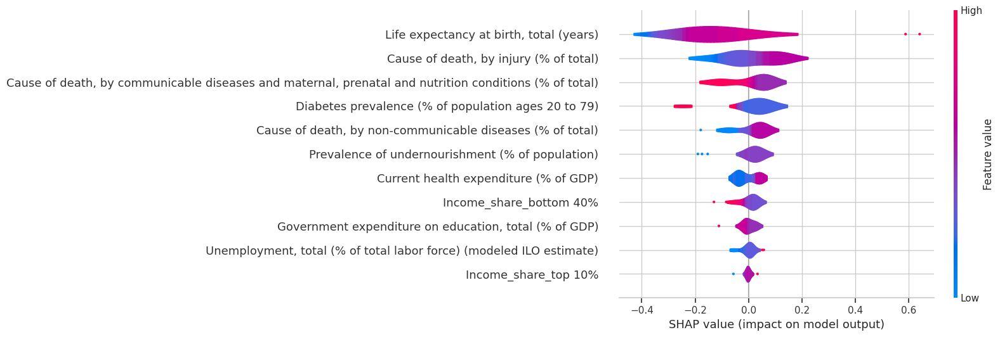


Top 5 SDoH for Diabetes in Income group = Low income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.181498
1             Cause of death, by injury (% of total)     0.082340
0  Cause of death, by communicable diseases and m...     0.070850
6  Diabetes prevalence (% of population ages 20 t...     0.069878
2  Cause of death, by non-communicable diseases (...     0.055215
SHAP summary (violin) for Diabetes in Income group = Upper middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


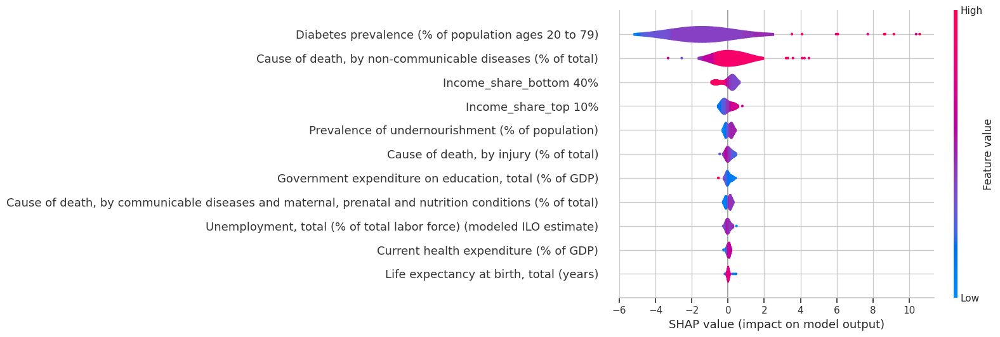


Top 5 SDoH for Diabetes in Income group = Upper middle income:
                                             Feature  Mean |SHAP|
6  Diabetes prevalence (% of population ages 20 t...     2.588209
2  Cause of death, by non-communicable diseases (...     0.972036
4                            Income_share_bottom 40%     0.331487
5                               Income_share_top 10%     0.253699
9   Prevalence of undernourishment (% of population)     0.162114
SHAP summary (violin) for Diabetes in Income group = Lower middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


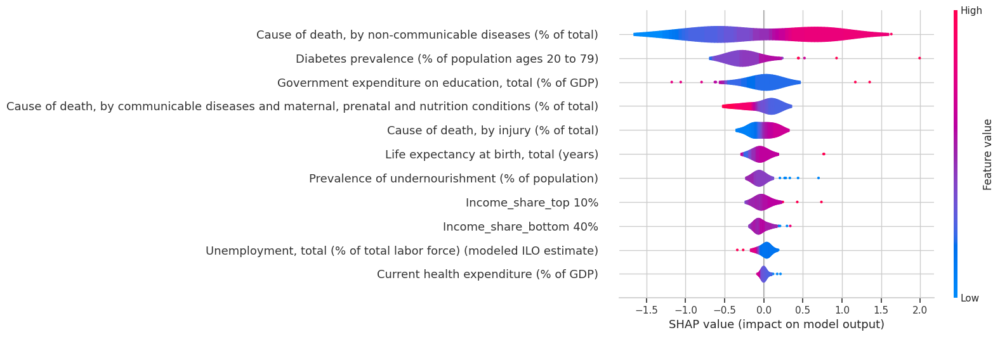


Top 5 SDoH for Diabetes in Income group = Lower middle income:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     0.686823
6  Diabetes prevalence (% of population ages 20 t...     0.336275
7  Government expenditure on education, total (% ...     0.234497
0  Cause of death, by communicable diseases and m...     0.167426
1             Cause of death, by injury (% of total)     0.127231
SHAP summary (violin) for Diabetes in Income group = High income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


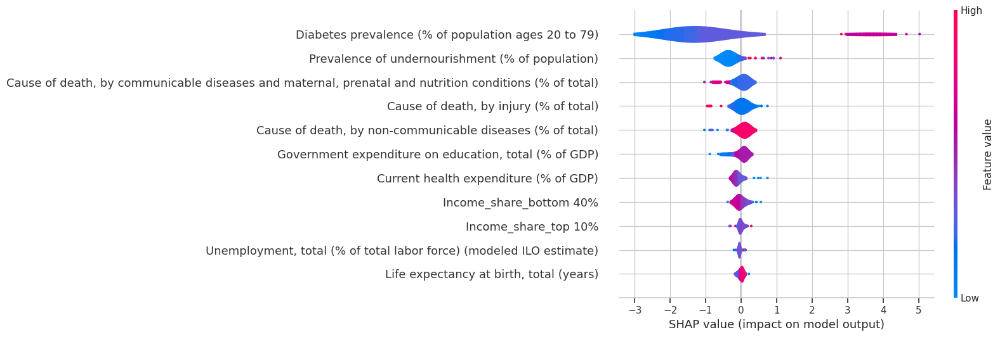


Top 5 SDoH for Diabetes in Income group = High income:
                                             Feature  Mean |SHAP|
6  Diabetes prevalence (% of population ages 20 t...     1.675604
9   Prevalence of undernourishment (% of population)     0.407589
0  Cause of death, by communicable diseases and m...     0.215772
1             Cause of death, by injury (% of total)     0.207589
2  Cause of death, by non-communicable diseases (...     0.194027
SHAP summary (violin) for Cardiovascular Disease in Income group = Low income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


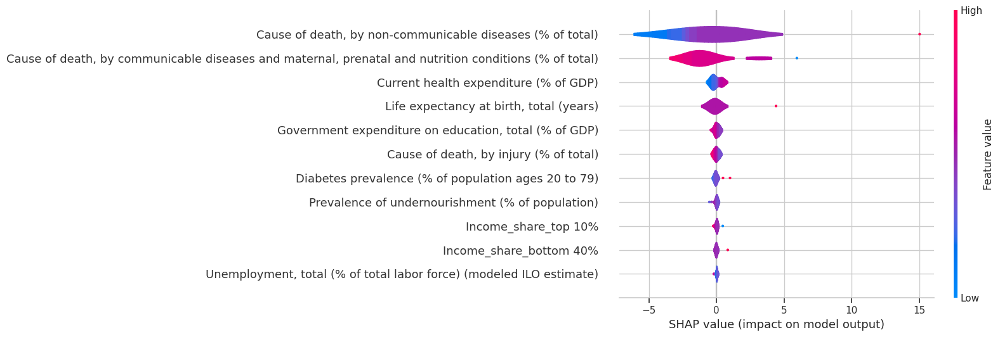


Top 5 SDoH for Cardiovascular Disease in Income group = Low income:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     2.226240
0  Cause of death, by communicable diseases and m...     1.709833
3              Current health expenditure (% of GDP)     0.328774
8            Life expectancy at birth, total (years)     0.318316
7  Government expenditure on education, total (% ...     0.153049
SHAP summary (violin) for Cardiovascular Disease in Income group = Upper middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


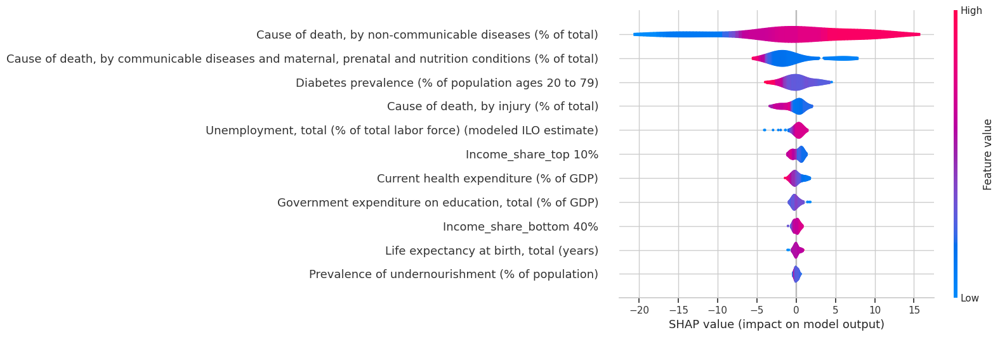


Top 5 SDoH for Cardiovascular Disease in Income group = Upper middle income:
                                              Feature  Mean |SHAP|
2   Cause of death, by non-communicable diseases (...     6.316711
0   Cause of death, by communicable diseases and m...     2.704178
6   Diabetes prevalence (% of population ages 20 t...     1.430037
1              Cause of death, by injury (% of total)     1.020921
10  Unemployment, total (% of total labor force) (...     0.658819
SHAP summary (violin) for Cardiovascular Disease in Income group = Lower middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


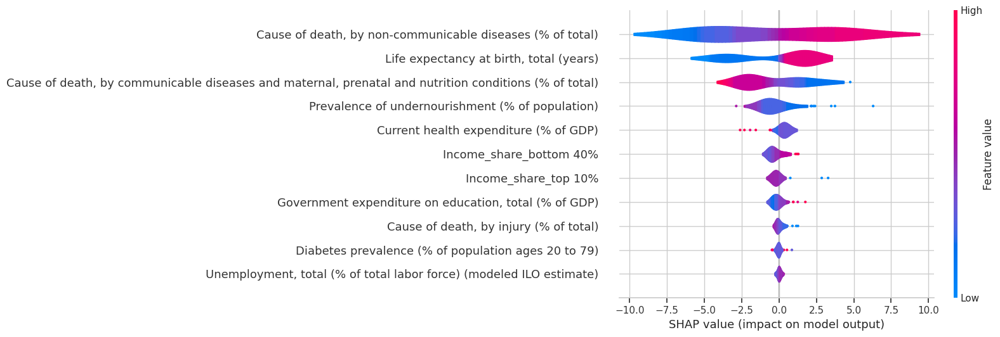


Top 5 SDoH for Cardiovascular Disease in Income group = Lower middle income:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     3.977398
8            Life expectancy at birth, total (years)     2.412685
0  Cause of death, by communicable diseases and m...     1.955472
9   Prevalence of undernourishment (% of population)     1.089554
3              Current health expenditure (% of GDP)     0.529520
SHAP summary (violin) for Cardiovascular Disease in Income group = High income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


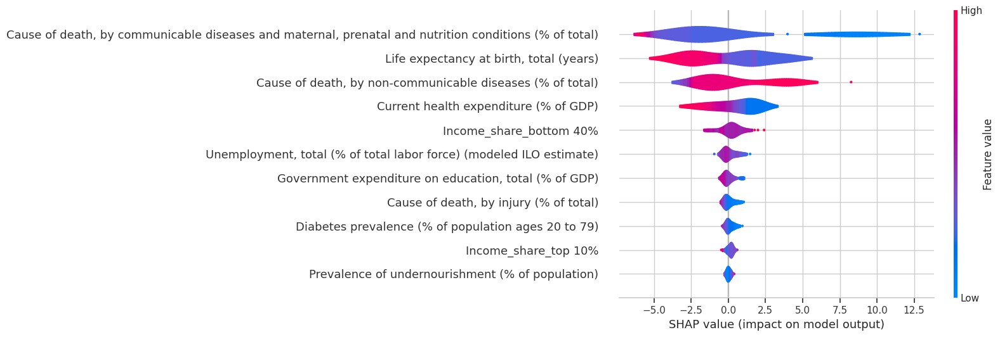


Top 5 SDoH for Cardiovascular Disease in Income group = High income:
                                             Feature  Mean |SHAP|
0  Cause of death, by communicable diseases and m...     3.824496
8            Life expectancy at birth, total (years)     2.293673
2  Cause of death, by non-communicable diseases (...     2.075760
3              Current health expenditure (% of GDP)     1.397384
4                            Income_share_bottom 40%     0.596109
SHAP summary (violin) for Alzheimer’s Disease in Income group = Low income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


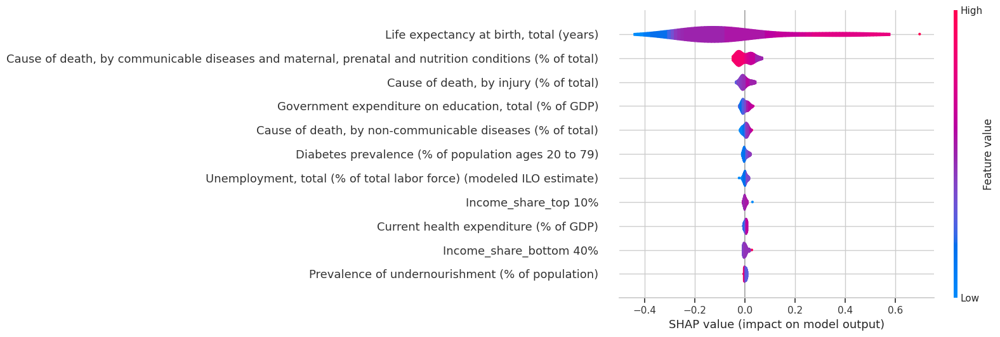


Top 5 SDoH for Alzheimer’s Disease in Income group = Low income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.202879
0  Cause of death, by communicable diseases and m...     0.027414
1             Cause of death, by injury (% of total)     0.015207
7  Government expenditure on education, total (% ...     0.011614
2  Cause of death, by non-communicable diseases (...     0.008861
SHAP summary (violin) for Alzheimer’s Disease in Income group = Upper middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


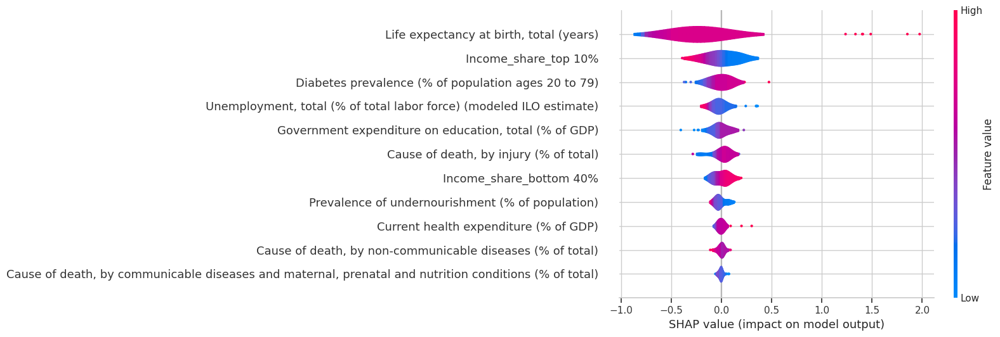


Top 5 SDoH for Alzheimer’s Disease in Income group = Upper middle income:
                                              Feature  Mean |SHAP|
8             Life expectancy at birth, total (years)     0.409448
5                                Income_share_top 10%     0.134723
6   Diabetes prevalence (% of population ages 20 t...     0.102048
10  Unemployment, total (% of total labor force) (...     0.084924
7   Government expenditure on education, total (% ...     0.078479
SHAP summary (violin) for Alzheimer’s Disease in Income group = Lower middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


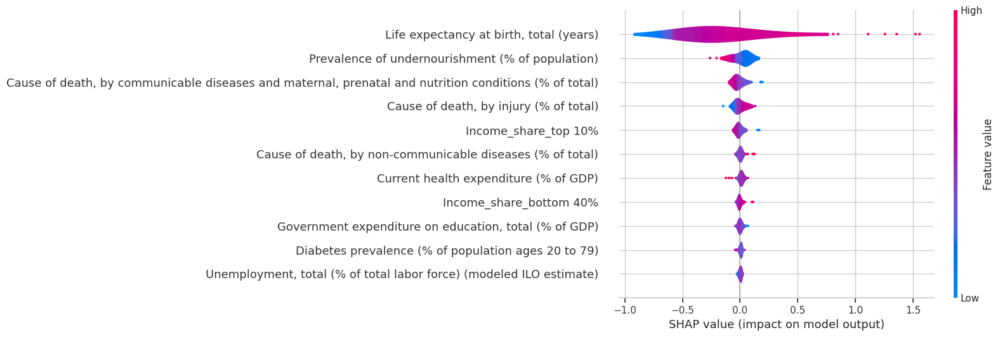


Top 5 SDoH for Alzheimer’s Disease in Income group = Lower middle income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.422901
9   Prevalence of undernourishment (% of population)     0.070312
0  Cause of death, by communicable diseases and m...     0.049566
1             Cause of death, by injury (% of total)     0.041586
5                               Income_share_top 10%     0.028839
SHAP summary (violin) for Alzheimer’s Disease in Income group = High income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


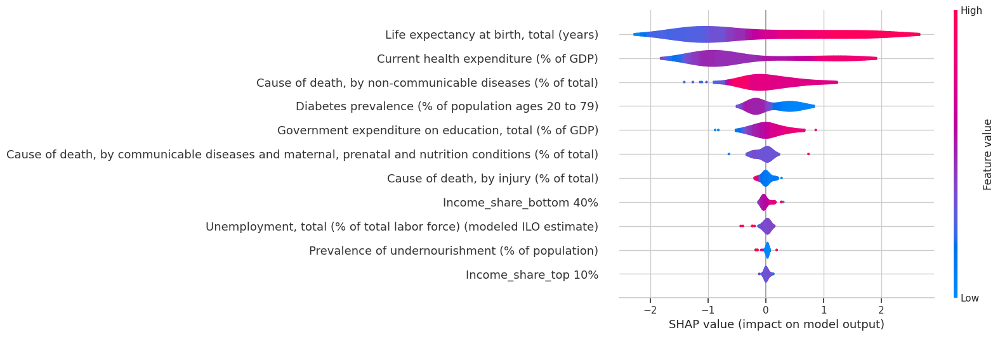


Top 5 SDoH for Alzheimer’s Disease in Income group = High income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     1.083728
3              Current health expenditure (% of GDP)     0.934616
2  Cause of death, by non-communicable diseases (...     0.414452
6  Diabetes prevalence (% of population ages 20 t...     0.302527
7  Government expenditure on education, total (% ...     0.232302
SHAP summary (violin) for Asthma in Income group = Low income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


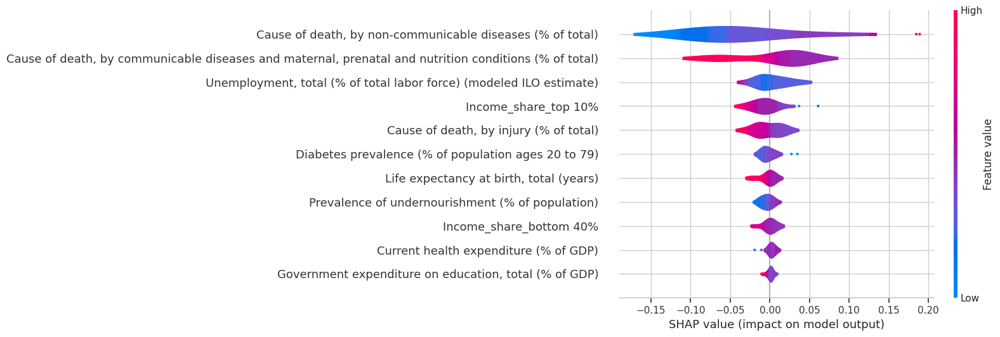


Top 5 SDoH for Asthma in Income group = Low income:
                                              Feature  Mean |SHAP|
2   Cause of death, by non-communicable diseases (...     0.069451
0   Cause of death, by communicable diseases and m...     0.040470
10  Unemployment, total (% of total labor force) (...     0.016949
5                                Income_share_top 10%     0.015732
1              Cause of death, by injury (% of total)     0.015145
SHAP summary (violin) for Asthma in Income group = Upper middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


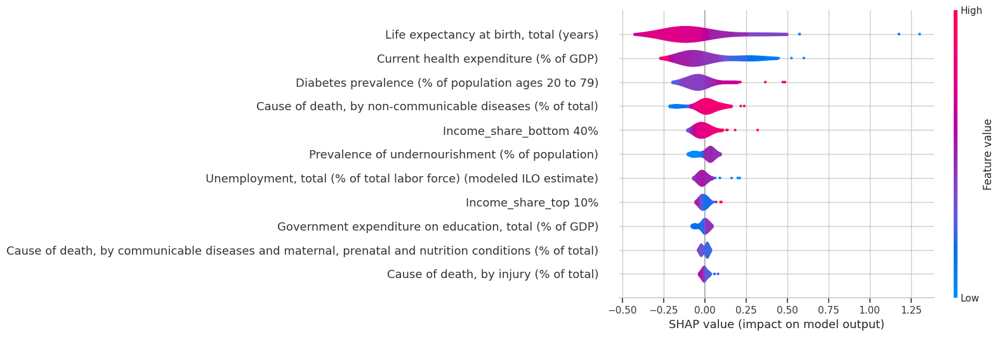


Top 5 SDoH for Asthma in Income group = Upper middle income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.209691
3              Current health expenditure (% of GDP)     0.147522
6  Diabetes prevalence (% of population ages 20 t...     0.089410
2  Cause of death, by non-communicable diseases (...     0.063931
4                            Income_share_bottom 40%     0.047685
SHAP summary (violin) for Asthma in Income group = Lower middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


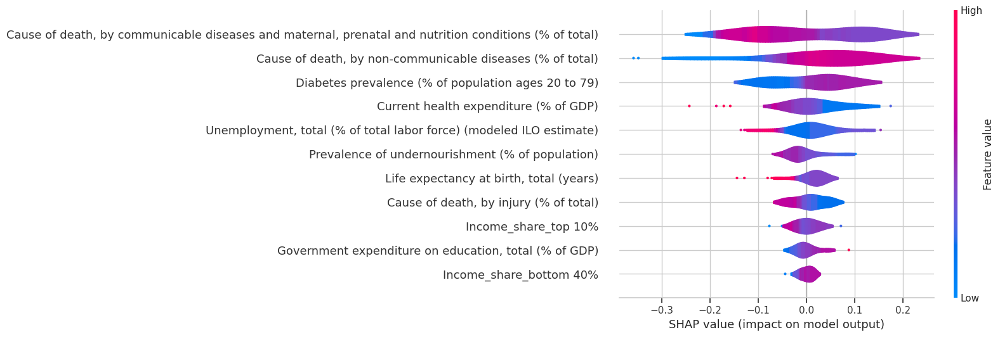


Top 5 SDoH for Asthma in Income group = Lower middle income:
                                              Feature  Mean |SHAP|
0   Cause of death, by communicable diseases and m...     0.100928
2   Cause of death, by non-communicable diseases (...     0.098669
6   Diabetes prevalence (% of population ages 20 t...     0.061991
3               Current health expenditure (% of GDP)     0.052248
10  Unemployment, total (% of total labor force) (...     0.042335
SHAP summary (violin) for Asthma in Income group = High income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


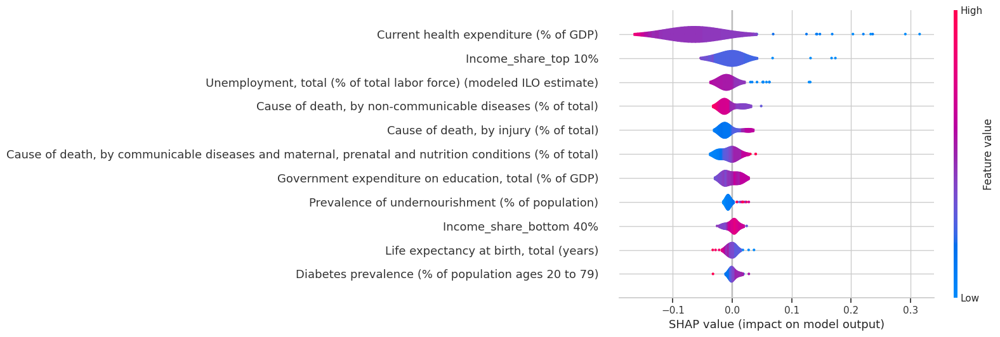


Top 5 SDoH for Asthma in Income group = High income:
                                              Feature  Mean |SHAP|
3               Current health expenditure (% of GDP)     0.088429
5                                Income_share_top 10%     0.020455
10  Unemployment, total (% of total labor force) (...     0.019570
2   Cause of death, by non-communicable diseases (...     0.015898
1              Cause of death, by injury (% of total)     0.015462
SHAP summary (violin) for Kidney Disease in Income group = Low income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


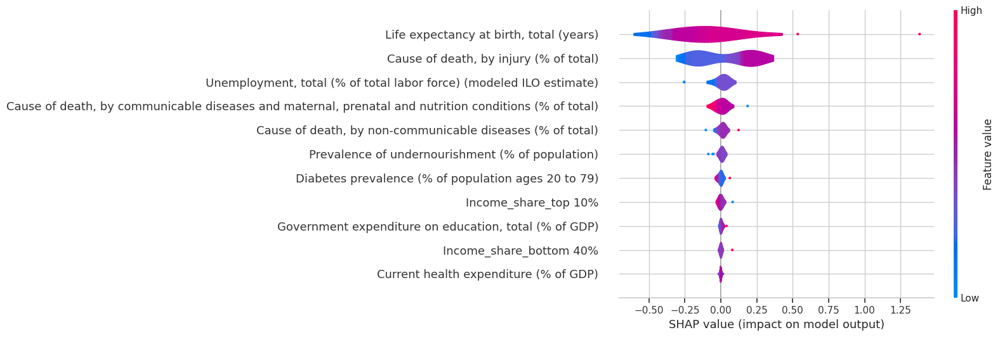


Top 5 SDoH for Kidney Disease in Income group = Low income:
                                              Feature  Mean |SHAP|
8             Life expectancy at birth, total (years)     0.220080
1              Cause of death, by injury (% of total)     0.184037
10  Unemployment, total (% of total labor force) (...     0.045751
0   Cause of death, by communicable diseases and m...     0.037555
2   Cause of death, by non-communicable diseases (...     0.025893
SHAP summary (violin) for Kidney Disease in Income group = Upper middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


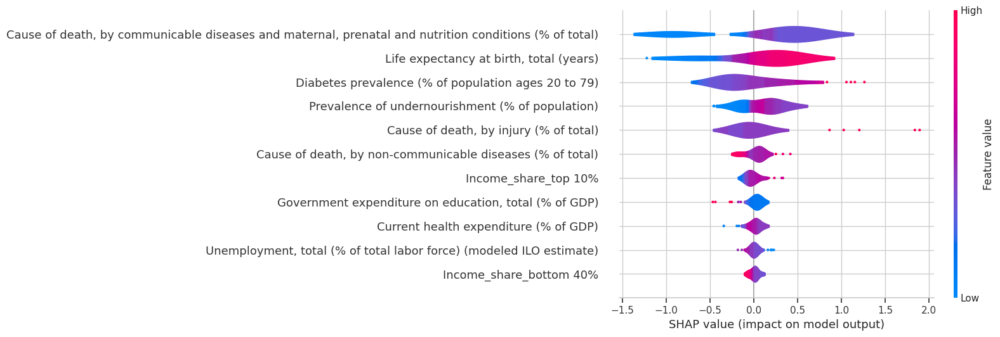


Top 5 SDoH for Kidney Disease in Income group = Upper middle income:
                                             Feature  Mean |SHAP|
0  Cause of death, by communicable diseases and m...     0.585876
8            Life expectancy at birth, total (years)     0.397924
6  Diabetes prevalence (% of population ages 20 t...     0.344903
9   Prevalence of undernourishment (% of population)     0.219226
1             Cause of death, by injury (% of total)     0.197676
SHAP summary (violin) for Kidney Disease in Income group = Lower middle income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


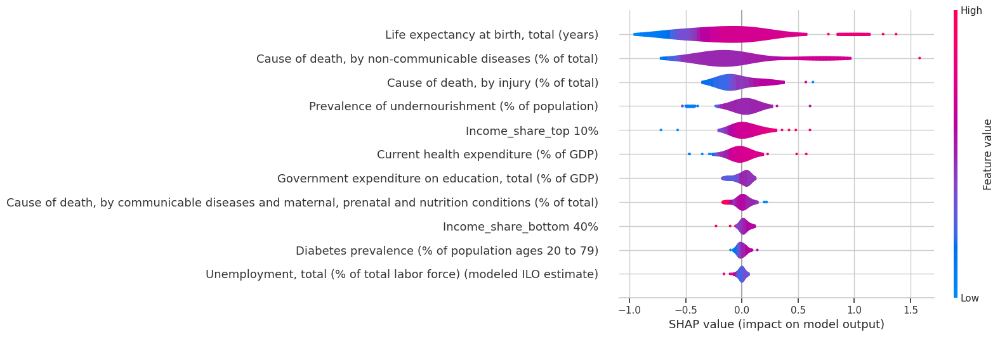


Top 5 SDoH for Kidney Disease in Income group = Lower middle income:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.358351
2  Cause of death, by non-communicable diseases (...     0.320725
1             Cause of death, by injury (% of total)     0.160127
9   Prevalence of undernourishment (% of population)     0.130221
5                               Income_share_top 10%     0.117514
SHAP summary (violin) for Kidney Disease in Income group = High income


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


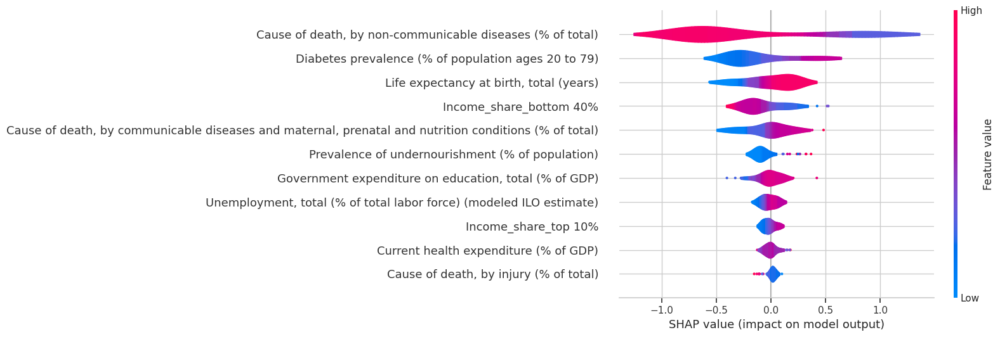


Top 5 SDoH for Kidney Disease in Income group = High income:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     0.663493
6  Diabetes prevalence (% of population ages 20 t...     0.290543
8            Life expectancy at birth, total (years)     0.193241
4                            Income_share_bottom 40%     0.184157
0  Cause of death, by communicable diseases and m...     0.153816


In [43]:
# Define the features
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Call the function for each disease
diseases = {
    'Diabetes': '%death by diabetes',
    'Cardiovascular Disease': '%death by cardiovascular_diseases',
    'Alzheimer’s Disease': '%death by alzheimer_and_other_dementia',
    'Asthma': '%death by asthma',
    'Kidney Disease': '%death by kidney_diseases'
}

for disease_name, target_col in diseases.items():
    shap_analysis_by_group(
        df=df_new,
        group_col='Income group',
        target_col=target_col,
        feature_cols=features,
        disease_name=disease_name
    )


/tmp/ipython-input-44-2476651459.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


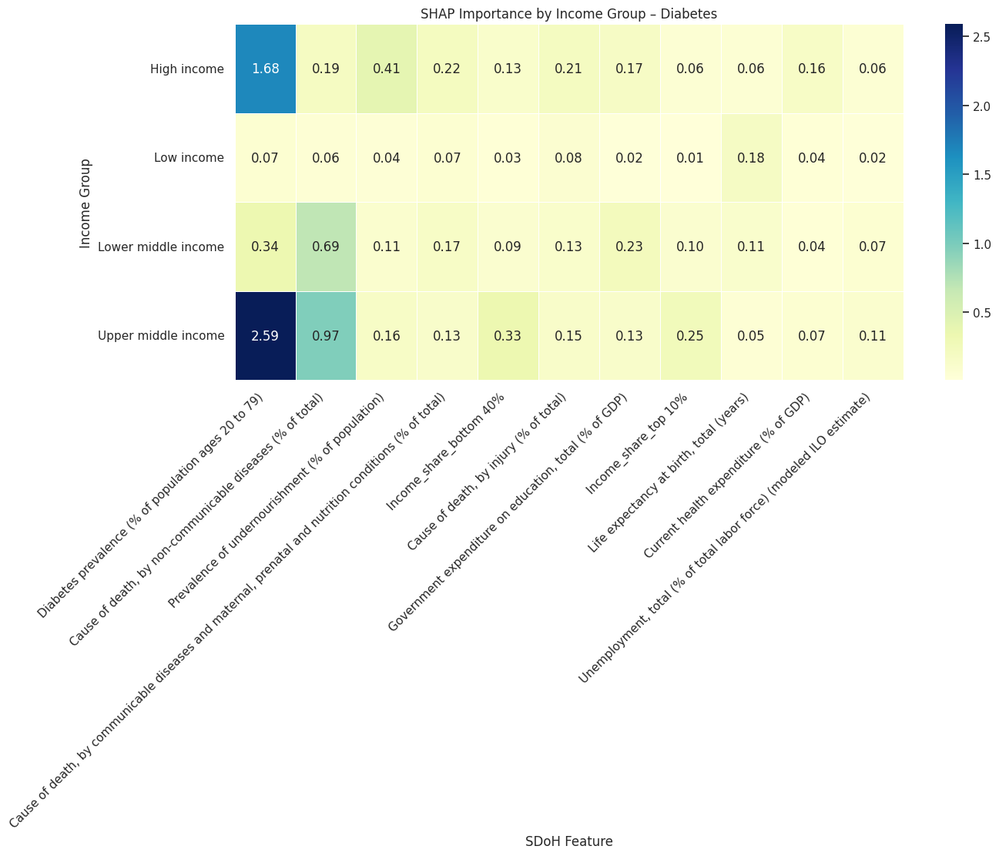

/tmp/ipython-input-44-2476651459.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


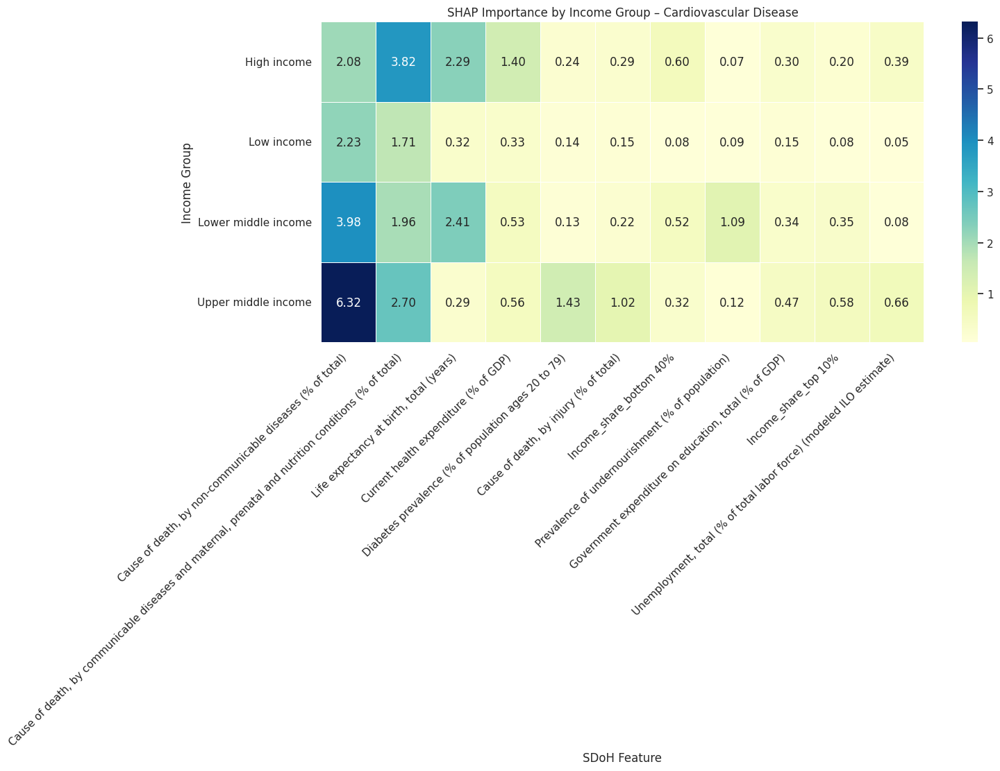

/tmp/ipython-input-44-2476651459.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


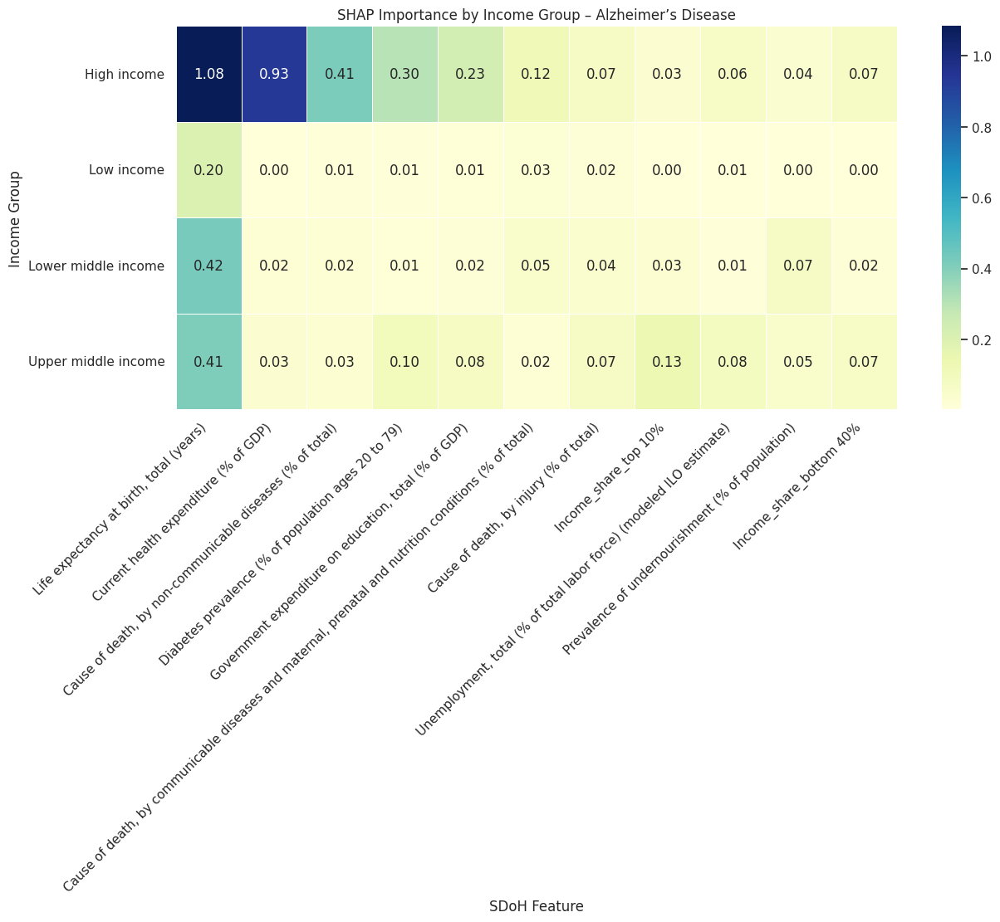

/tmp/ipython-input-44-2476651459.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


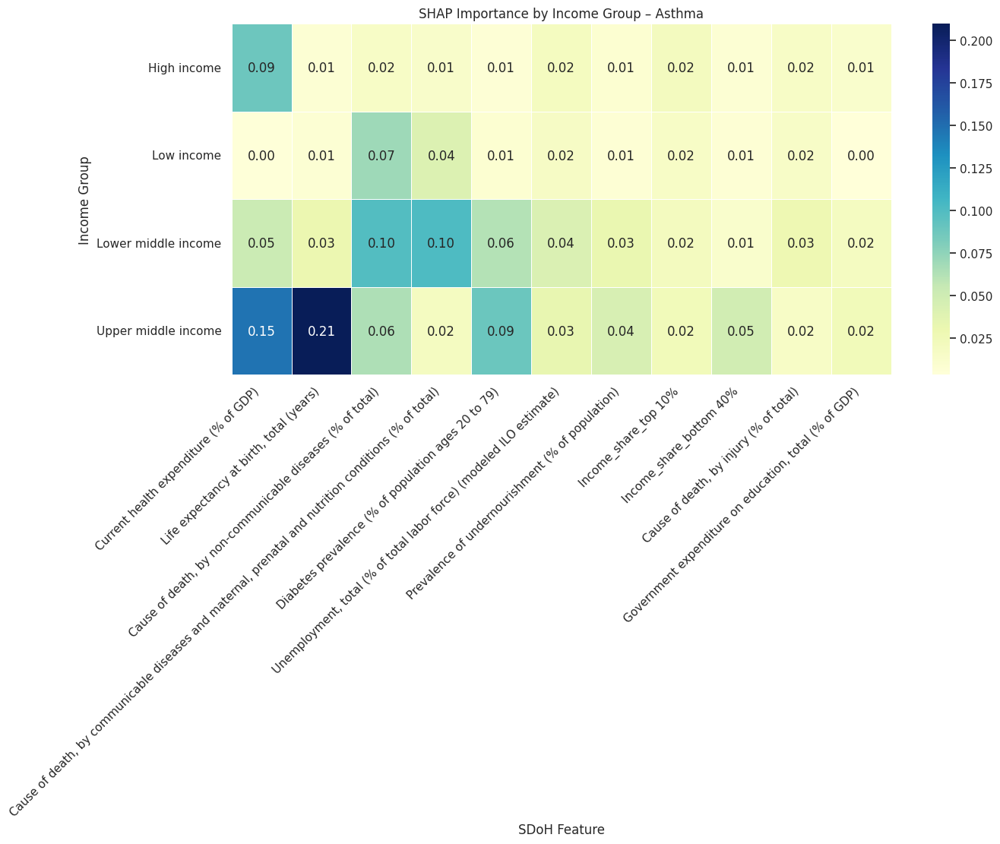

/tmp/ipython-input-44-2476651459.py:26: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


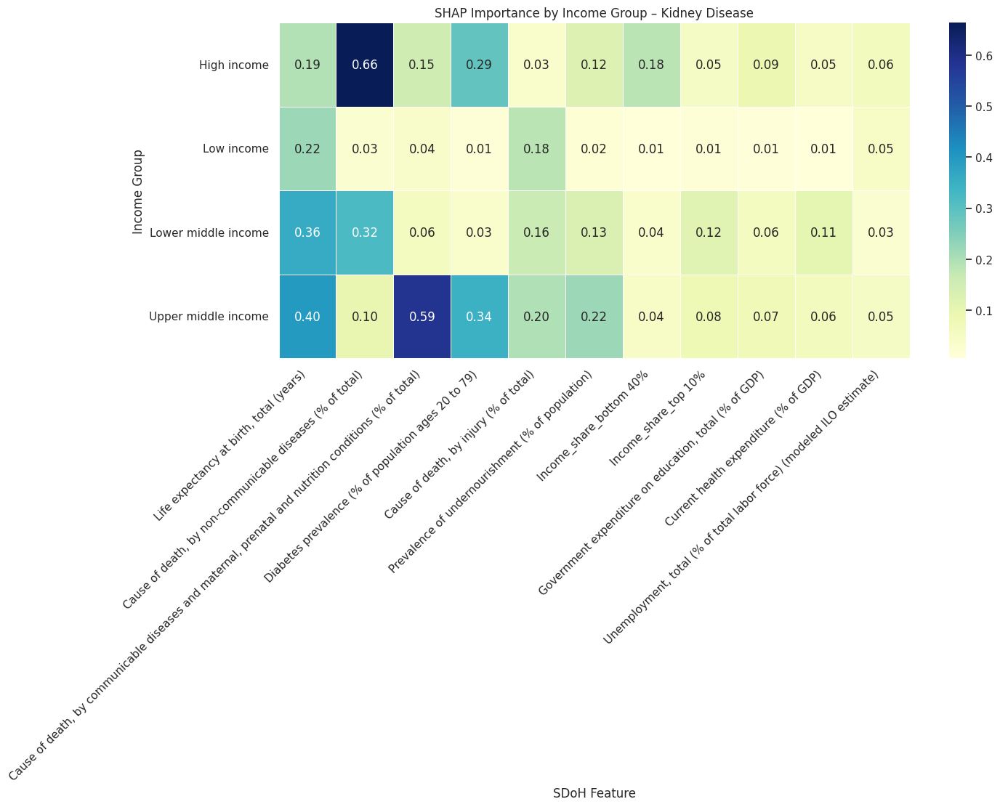

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Combine all SHAP results
shap_df = pd.concat(all_results, ignore_index=True)

# Create one heatmap per disease
for disease in shap_df['Disease'].unique():
    data = shap_df[shap_df['Disease'] == disease]

    # Pivot: rows = income groups, columns = features
    heatmap_data = data.pivot(index='Group', columns='Feature', values='Mean |SHAP|')

    # Optional: sort features by importance across all groups
    col_order = heatmap_data.mean().sort_values(ascending=False).index
    heatmap_data = heatmap_data[col_order]

    # Plot
    plt.figure(figsize=(14, 6))
    sns.heatmap(heatmap_data, cmap='YlGnBu', annot=True, fmt=".2f", linewidths=.5)
    plt.title(f'SHAP Importance by Income Group – {disease}')
    plt.ylabel('Income Group')
    plt.xlabel('SDoH Feature')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()


**Mortality by Chronic Disease across Regions**

In [45]:
# SHAP accross regions

all_results = []
def shap_analysis_by_group(df, group_col, target_col, feature_cols, disease_name):
    groups = df[group_col].dropna().unique()

    for group in groups:
        subset = df[df[group_col] == group]


        X = subset[feature_cols]
        y = subset[target_col]

        if X.isnull().any().any() or y.isnull().any():
            print(f"Missing data in group {group}, skipping...")
            continue

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42
        )

        model = RandomForestRegressor(n_estimators=100, random_state=42)
        model.fit(X_train, y_train)

        explainer = shap.TreeExplainer(model, X_train)
        shap_values = explainer(X_test, check_additivity=False)



        #  Violin-style SHAP summary plot
        print(f"SHAP summary (violin) for {disease_name} in {group_col} = {group}")
        shap.summary_plot(shap_values, features=X_test, feature_names=feature_cols, plot_type='violin', show=True)


        #  Inspect SHAP values numerically
        mean_shap = pd.DataFrame({
            'Feature': feature_cols,
            'Mean |SHAP|': np.abs(shap_values.values).mean(axis=0)
        }).sort_values(by='Mean |SHAP|', ascending=False)

        print(f'\nTop 5 SDoH for {disease_name} in {group_col} = {group}:')
        print(mean_shap.head(5))

        plt.close()  # Close plot to avoid overlaps in loops

        mean_shap['Disease'] = disease_name
        mean_shap['Group'] = group
        all_results.append(mean_shap)

SHAP summary (violin) for Diabetes in Region = South Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


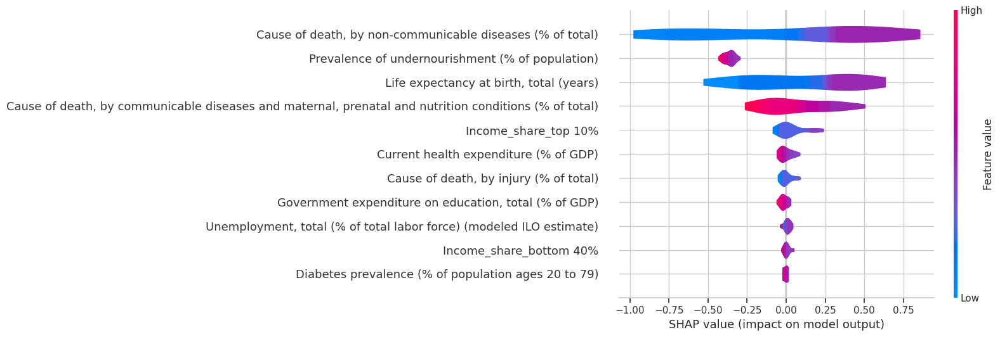


Top 5 SDoH for Diabetes in Region = South Asia:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     0.523060
9   Prevalence of undernourishment (% of population)     0.365684
8            Life expectancy at birth, total (years)     0.310473
0  Cause of death, by communicable diseases and m...     0.164527
5                               Income_share_top 10%     0.048678
SHAP summary (violin) for Diabetes in Region = Europe & Central Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


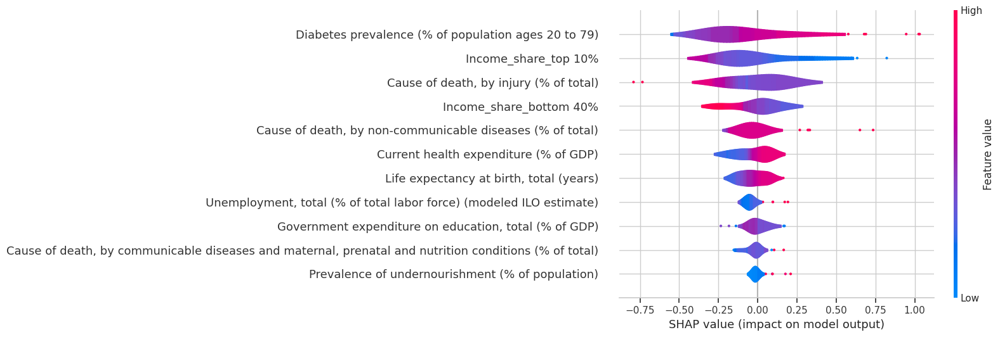


Top 5 SDoH for Diabetes in Region = Europe & Central Asia:
                                             Feature  Mean |SHAP|
6  Diabetes prevalence (% of population ages 20 t...     0.276924
5                               Income_share_top 10%     0.207348
1             Cause of death, by injury (% of total)     0.172311
4                            Income_share_bottom 40%     0.114212
2  Cause of death, by non-communicable diseases (...     0.094489
SHAP summary (violin) for Diabetes in Region = Middle East & North Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


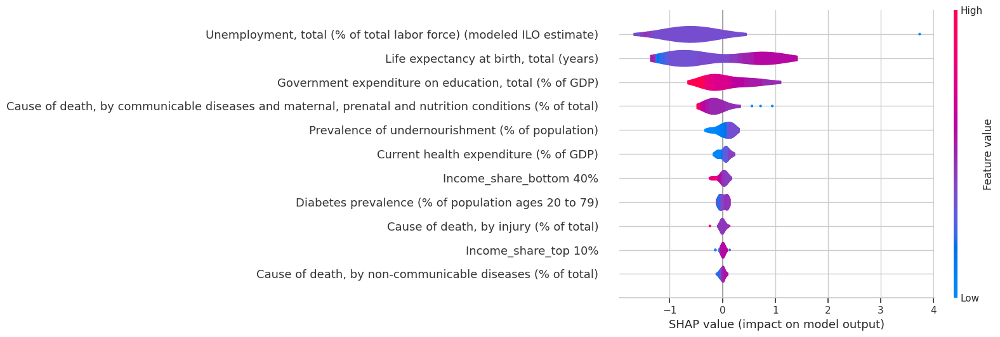


Top 5 SDoH for Diabetes in Region = Middle East & North Africa:
                                              Feature  Mean |SHAP|
10  Unemployment, total (% of total labor force) (...     0.759833
8             Life expectancy at birth, total (years)     0.736424
7   Government expenditure on education, total (% ...     0.332280
0   Cause of death, by communicable diseases and m...     0.256218
9    Prevalence of undernourishment (% of population)     0.128619
SHAP summary (violin) for Diabetes in Region = Sub-Saharan Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


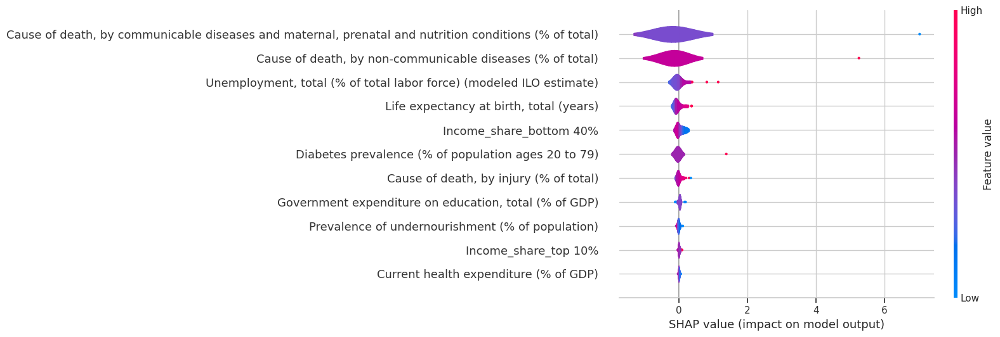


Top 5 SDoH for Diabetes in Region = Sub-Saharan Africa:
                                              Feature  Mean |SHAP|
0   Cause of death, by communicable diseases and m...     0.445902
2   Cause of death, by non-communicable diseases (...     0.312384
10  Unemployment, total (% of total labor force) (...     0.137735
8             Life expectancy at birth, total (years)     0.112145
4                             Income_share_bottom 40%     0.091758
SHAP summary (violin) for Diabetes in Region = Latin America & Caribbean


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


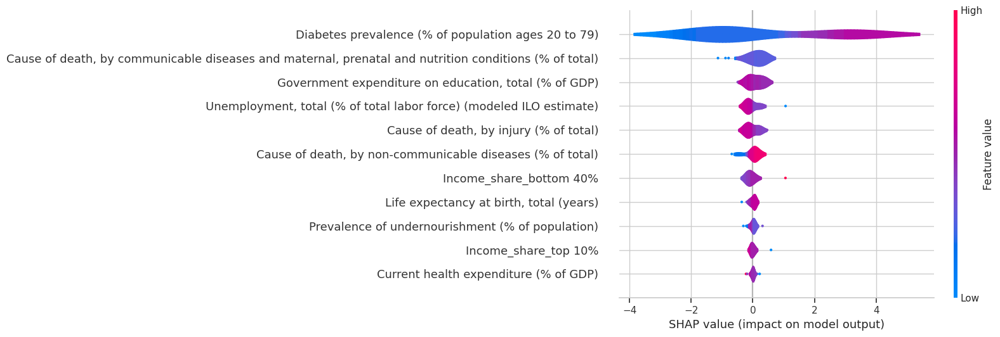


Top 5 SDoH for Diabetes in Region = Latin America & Caribbean:
                                              Feature  Mean |SHAP|
6   Diabetes prevalence (% of population ages 20 t...     1.915533
0   Cause of death, by communicable diseases and m...     0.301462
7   Government expenditure on education, total (% ...     0.218392
10  Unemployment, total (% of total labor force) (...     0.204202
1              Cause of death, by injury (% of total)     0.192494
SHAP summary (violin) for Diabetes in Region = East Asia & Pacific


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


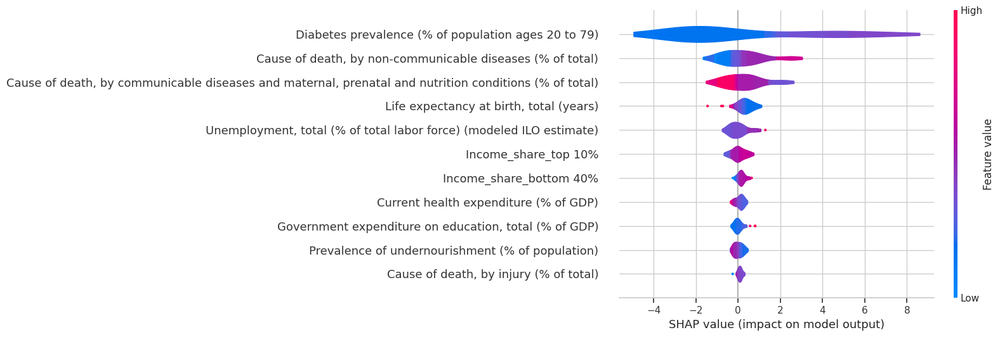


Top 5 SDoH for Diabetes in Region = East Asia & Pacific:
                                              Feature  Mean |SHAP|
6   Diabetes prevalence (% of population ages 20 t...     2.950004
2   Cause of death, by non-communicable diseases (...     0.794766
0   Cause of death, by communicable diseases and m...     0.727858
8             Life expectancy at birth, total (years)     0.436507
10  Unemployment, total (% of total labor force) (...     0.331005
SHAP summary (violin) for Diabetes in Region = North America


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


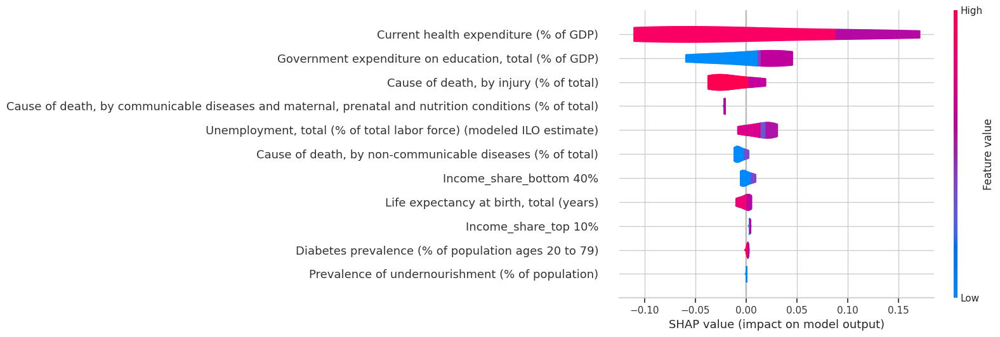


Top 5 SDoH for Diabetes in Region = North America:
                                              Feature  Mean |SHAP|
3               Current health expenditure (% of GDP)     0.090601
7   Government expenditure on education, total (% ...     0.034119
1              Cause of death, by injury (% of total)     0.022678
0   Cause of death, by communicable diseases and m...     0.021664
10  Unemployment, total (% of total labor force) (...     0.016020
SHAP summary (violin) for Cardiovascular Disease in Region = South Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


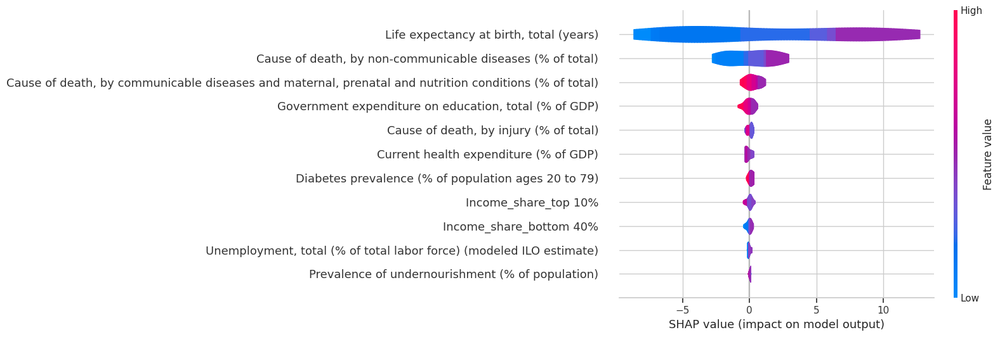


Top 5 SDoH for Cardiovascular Disease in Region = South Asia:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     6.099911
2  Cause of death, by non-communicable diseases (...     1.459288
0  Cause of death, by communicable diseases and m...     0.430854
7  Government expenditure on education, total (% ...     0.274295
1             Cause of death, by injury (% of total)     0.155525
SHAP summary (violin) for Cardiovascular Disease in Region = Europe & Central Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


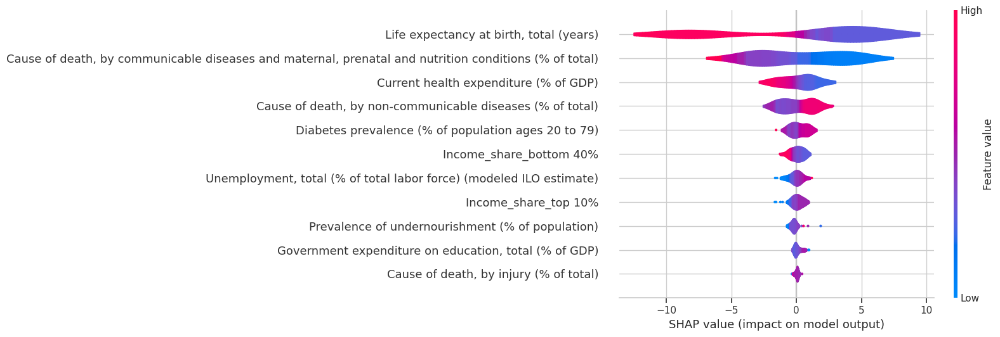


Top 5 SDoH for Cardiovascular Disease in Region = Europe & Central Asia:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     5.607416
0  Cause of death, by communicable diseases and m...     2.997718
3              Current health expenditure (% of GDP)     1.159583
2  Cause of death, by non-communicable diseases (...     1.103373
6  Diabetes prevalence (% of population ages 20 t...     0.556730
SHAP summary (violin) for Cardiovascular Disease in Region = Middle East & North Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


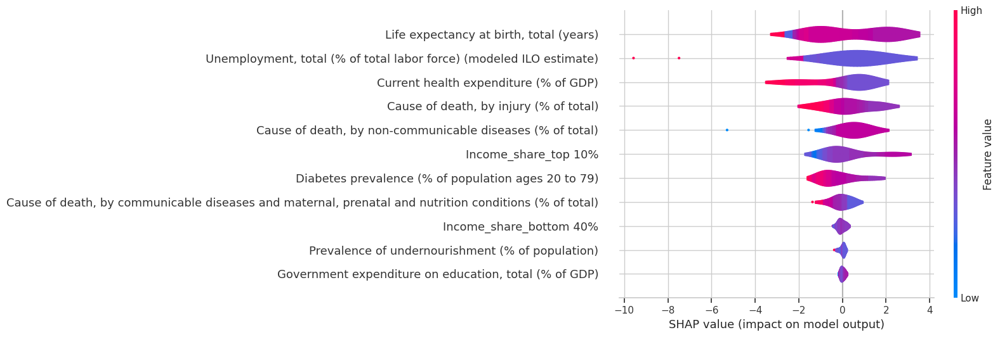


Top 5 SDoH for Cardiovascular Disease in Region = Middle East & North Africa:
                                              Feature  Mean |SHAP|
8             Life expectancy at birth, total (years)     1.567456
10  Unemployment, total (% of total labor force) (...     1.444258
3               Current health expenditure (% of GDP)     1.176366
1              Cause of death, by injury (% of total)     0.836095
2   Cause of death, by non-communicable diseases (...     0.799181
SHAP summary (violin) for Cardiovascular Disease in Region = Sub-Saharan Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


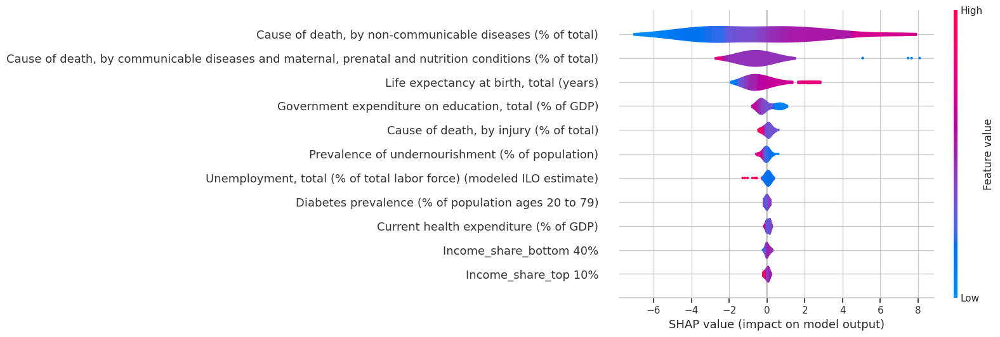


Top 5 SDoH for Cardiovascular Disease in Region = Sub-Saharan Africa:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     2.686022
0  Cause of death, by communicable diseases and m...     1.126370
8            Life expectancy at birth, total (years)     0.878769
7  Government expenditure on education, total (% ...     0.417016
1             Cause of death, by injury (% of total)     0.183315
SHAP summary (violin) for Cardiovascular Disease in Region = Latin America & Caribbean


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


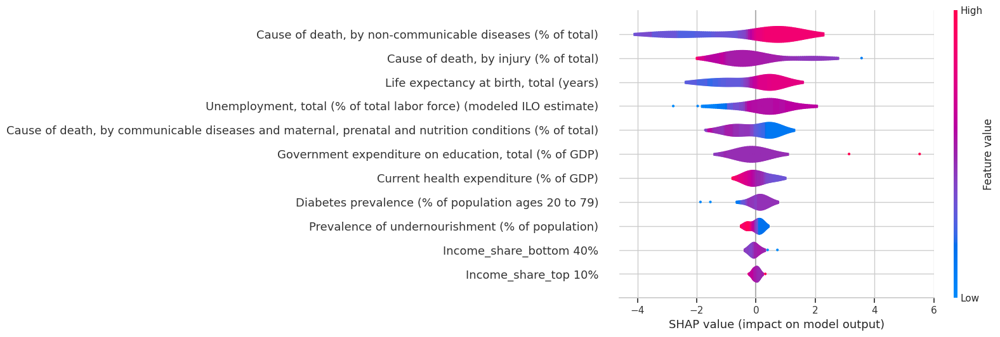


Top 5 SDoH for Cardiovascular Disease in Region = Latin America & Caribbean:
                                              Feature  Mean |SHAP|
2   Cause of death, by non-communicable diseases (...     1.342680
1              Cause of death, by injury (% of total)     0.885024
8             Life expectancy at birth, total (years)     0.808175
10  Unemployment, total (% of total labor force) (...     0.787946
0   Cause of death, by communicable diseases and m...     0.618453
SHAP summary (violin) for Cardiovascular Disease in Region = East Asia & Pacific


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


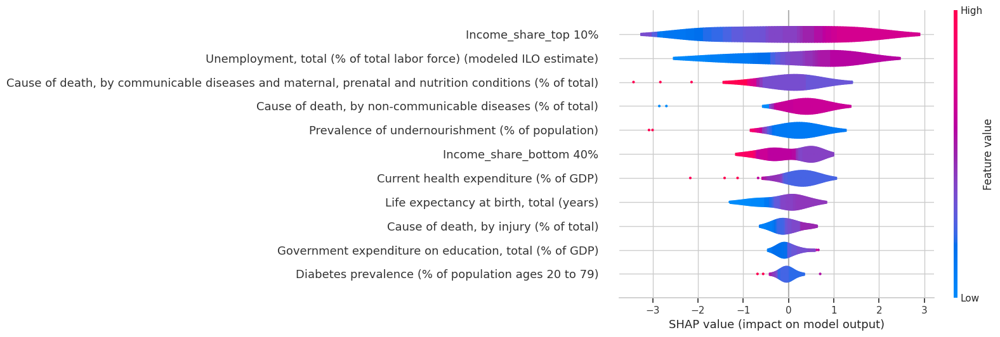


Top 5 SDoH for Cardiovascular Disease in Region = East Asia & Pacific:
                                              Feature  Mean |SHAP|
5                                Income_share_top 10%     1.184618
10  Unemployment, total (% of total labor force) (...     0.973268
0   Cause of death, by communicable diseases and m...     0.641198
2   Cause of death, by non-communicable diseases (...     0.581009
9    Prevalence of undernourishment (% of population)     0.490560
SHAP summary (violin) for Cardiovascular Disease in Region = North America


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


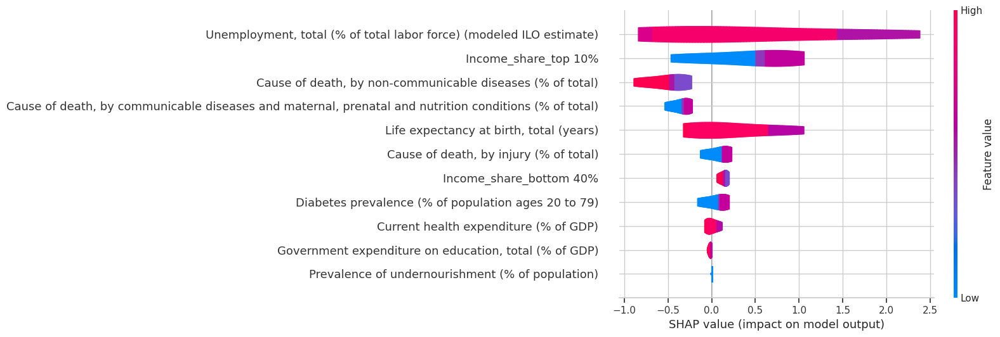


Top 5 SDoH for Cardiovascular Disease in Region = North America:
                                              Feature  Mean |SHAP|
10  Unemployment, total (% of total labor force) (...     0.839308
5                                Income_share_top 10%     0.605509
2   Cause of death, by non-communicable diseases (...     0.502889
0   Cause of death, by communicable diseases and m...     0.350885
8             Life expectancy at birth, total (years)     0.347678
SHAP summary (violin) for Alzheimer’s Disease in Region = South Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


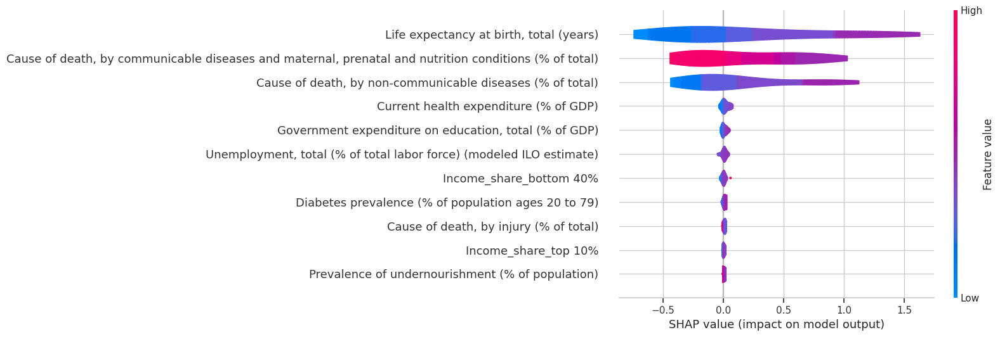


Top 5 SDoH for Alzheimer’s Disease in Region = South Asia:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.514766
0  Cause of death, by communicable diseases and m...     0.383865
2  Cause of death, by non-communicable diseases (...     0.309859
3              Current health expenditure (% of GDP)     0.022087
7  Government expenditure on education, total (% ...     0.015799
SHAP summary (violin) for Alzheimer’s Disease in Region = Europe & Central Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


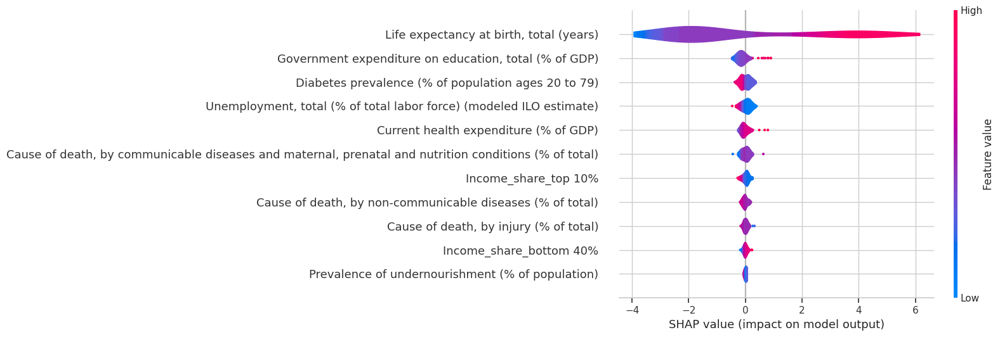


Top 5 SDoH for Alzheimer’s Disease in Region = Europe & Central Asia:
                                              Feature  Mean |SHAP|
8             Life expectancy at birth, total (years)     2.542154
7   Government expenditure on education, total (% ...     0.250349
6   Diabetes prevalence (% of population ages 20 t...     0.147618
10  Unemployment, total (% of total labor force) (...     0.143122
3               Current health expenditure (% of GDP)     0.131747
SHAP summary (violin) for Alzheimer’s Disease in Region = Middle East & North Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


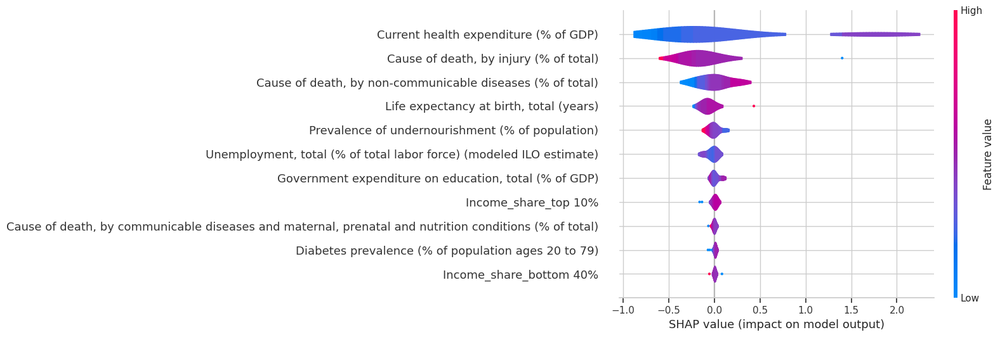


Top 5 SDoH for Alzheimer’s Disease in Region = Middle East & North Africa:
                                             Feature  Mean |SHAP|
3              Current health expenditure (% of GDP)     0.548104
1             Cause of death, by injury (% of total)     0.243971
2  Cause of death, by non-communicable diseases (...     0.138023
8            Life expectancy at birth, total (years)     0.100200
9   Prevalence of undernourishment (% of population)     0.048482
SHAP summary (violin) for Alzheimer’s Disease in Region = Sub-Saharan Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


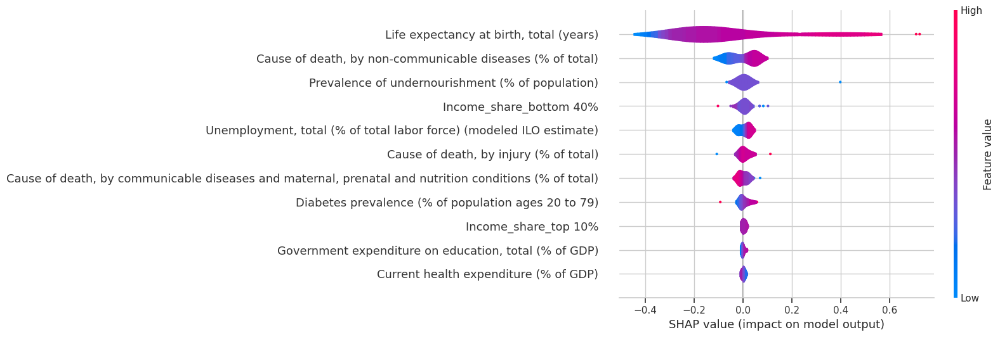


Top 5 SDoH for Alzheimer’s Disease in Region = Sub-Saharan Africa:
                                              Feature  Mean |SHAP|
8             Life expectancy at birth, total (years)     0.219646
2   Cause of death, by non-communicable diseases (...     0.050336
9    Prevalence of undernourishment (% of population)     0.020817
4                             Income_share_bottom 40%     0.020734
10  Unemployment, total (% of total labor force) (...     0.020225
SHAP summary (violin) for Alzheimer’s Disease in Region = Latin America & Caribbean


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


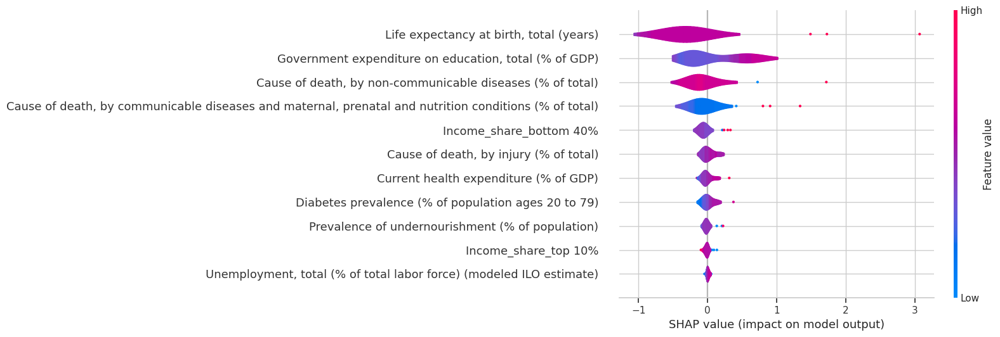


Top 5 SDoH for Alzheimer’s Disease in Region = Latin America & Caribbean:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.485103
7  Government expenditure on education, total (% ...     0.359680
2  Cause of death, by non-communicable diseases (...     0.219606
0  Cause of death, by communicable diseases and m...     0.205006
4                            Income_share_bottom 40%     0.092623
SHAP summary (violin) for Alzheimer’s Disease in Region = East Asia & Pacific


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


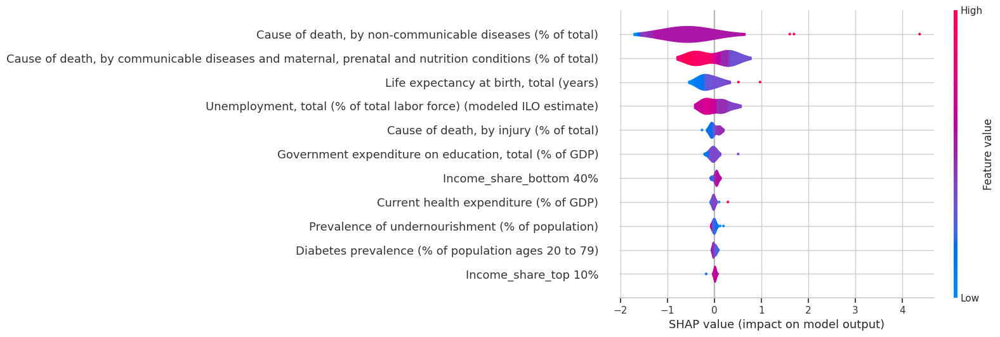


Top 5 SDoH for Alzheimer’s Disease in Region = East Asia & Pacific:
                                              Feature  Mean |SHAP|
2   Cause of death, by non-communicable diseases (...     0.793047
0   Cause of death, by communicable diseases and m...     0.356927
8             Life expectancy at birth, total (years)     0.224552
10  Unemployment, total (% of total labor force) (...     0.201958
1              Cause of death, by injury (% of total)     0.085168
SHAP summary (violin) for Alzheimer’s Disease in Region = North America


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


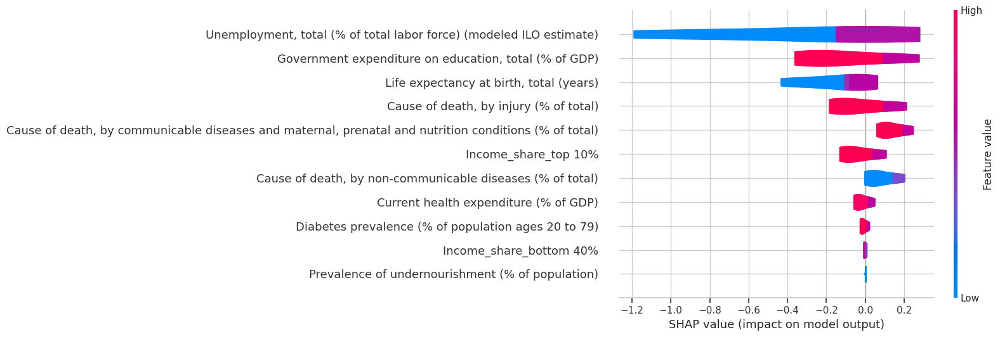


Top 5 SDoH for Alzheimer’s Disease in Region = North America:
                                              Feature  Mean |SHAP|
10  Unemployment, total (% of total labor force) (...     0.371641
7   Government expenditure on education, total (% ...     0.233322
8             Life expectancy at birth, total (years)     0.136416
1              Cause of death, by injury (% of total)     0.135865
0   Cause of death, by communicable diseases and m...     0.135615
SHAP summary (violin) for Asthma in Region = South Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


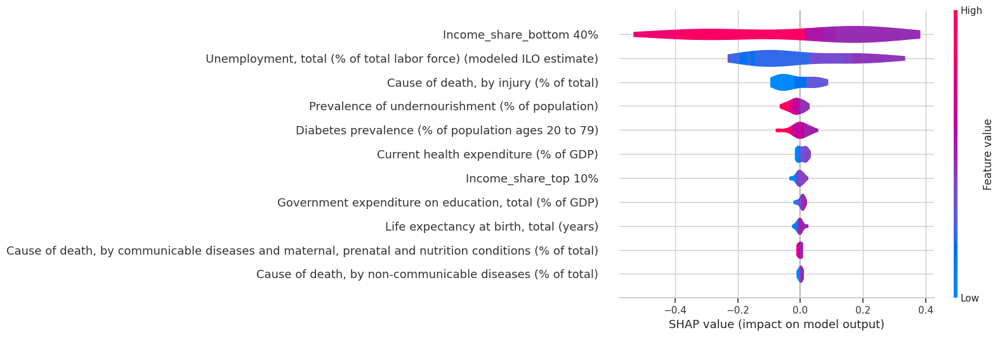


Top 5 SDoH for Asthma in Region = South Asia:
                                              Feature  Mean |SHAP|
4                             Income_share_bottom 40%     0.229938
10  Unemployment, total (% of total labor force) (...     0.134204
1              Cause of death, by injury (% of total)     0.049698
9    Prevalence of undernourishment (% of population)     0.021365
6   Diabetes prevalence (% of population ages 20 t...     0.020037
SHAP summary (violin) for Asthma in Region = Europe & Central Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


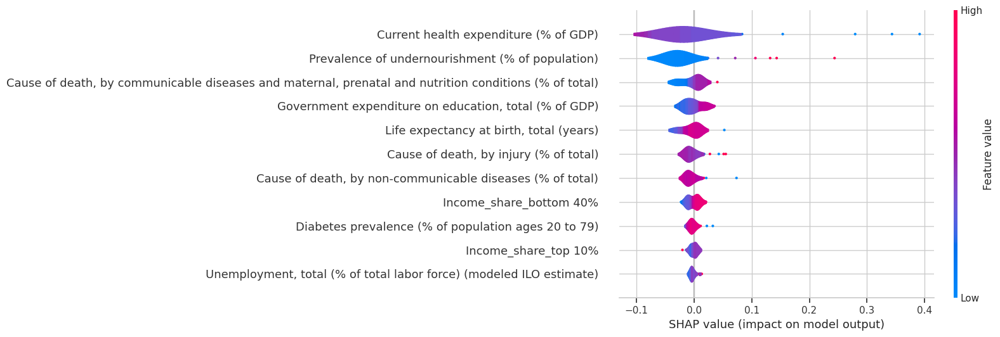


Top 5 SDoH for Asthma in Region = Europe & Central Asia:
                                             Feature  Mean |SHAP|
3              Current health expenditure (% of GDP)     0.045520
9   Prevalence of undernourishment (% of population)     0.040222
0  Cause of death, by communicable diseases and m...     0.015003
7  Government expenditure on education, total (% ...     0.013358
8            Life expectancy at birth, total (years)     0.013210
SHAP summary (violin) for Asthma in Region = Middle East & North Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


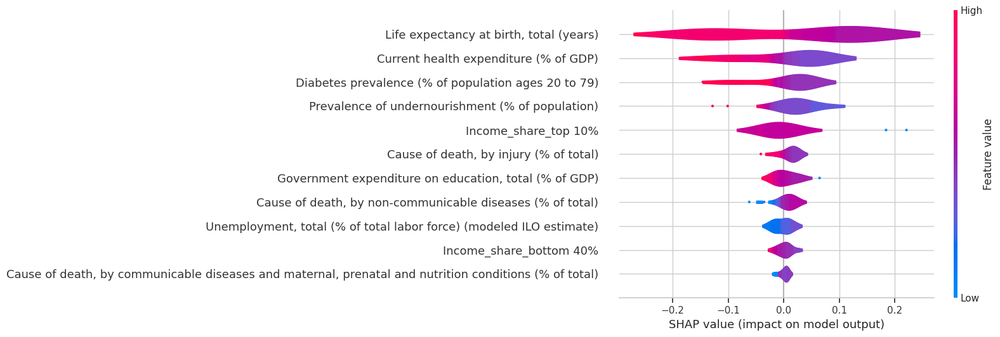


Top 5 SDoH for Asthma in Region = Middle East & North Africa:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.123912
3              Current health expenditure (% of GDP)     0.065757
6  Diabetes prevalence (% of population ages 20 t...     0.046739
9   Prevalence of undernourishment (% of population)     0.038210
5                               Income_share_top 10%     0.032433
SHAP summary (violin) for Asthma in Region = Sub-Saharan Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


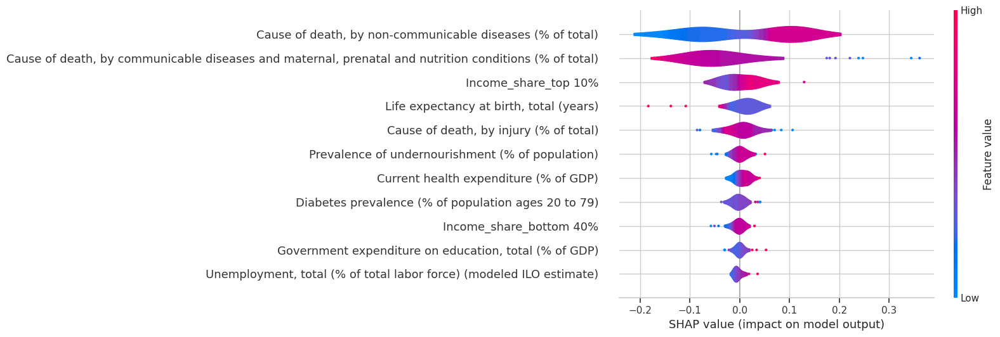


Top 5 SDoH for Asthma in Region = Sub-Saharan Africa:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     0.094450
0  Cause of death, by communicable diseases and m...     0.086765
5                               Income_share_top 10%     0.029790
8            Life expectancy at birth, total (years)     0.025817
1             Cause of death, by injury (% of total)     0.024784
SHAP summary (violin) for Asthma in Region = Latin America & Caribbean


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


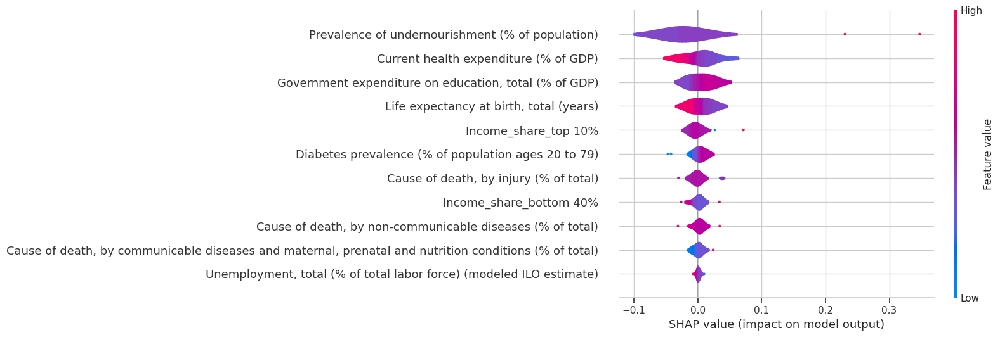


Top 5 SDoH for Asthma in Region = Latin America & Caribbean:
                                             Feature  Mean |SHAP|
9   Prevalence of undernourishment (% of population)     0.040734
3              Current health expenditure (% of GDP)     0.021223
7  Government expenditure on education, total (% ...     0.017060
8            Life expectancy at birth, total (years)     0.015803
5                               Income_share_top 10%     0.009660
SHAP summary (violin) for Asthma in Region = East Asia & Pacific


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


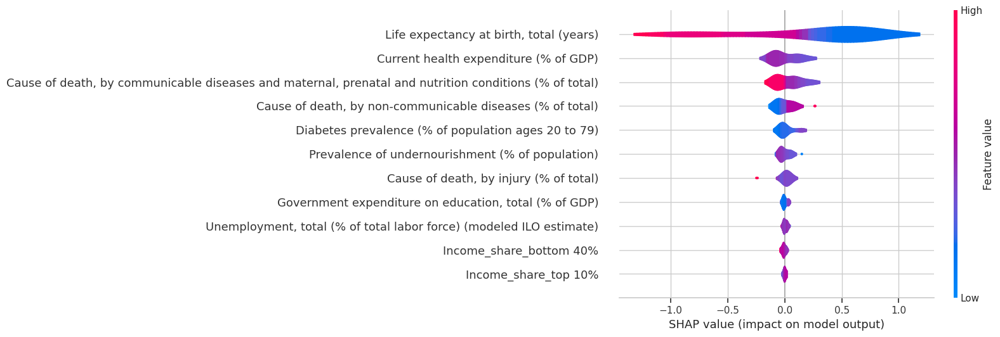


Top 5 SDoH for Asthma in Region = East Asia & Pacific:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.571737
3              Current health expenditure (% of GDP)     0.105573
0  Cause of death, by communicable diseases and m...     0.100661
2  Cause of death, by non-communicable diseases (...     0.075406
6  Diabetes prevalence (% of population ages 20 t...     0.049112
SHAP summary (violin) for Asthma in Region = North America


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


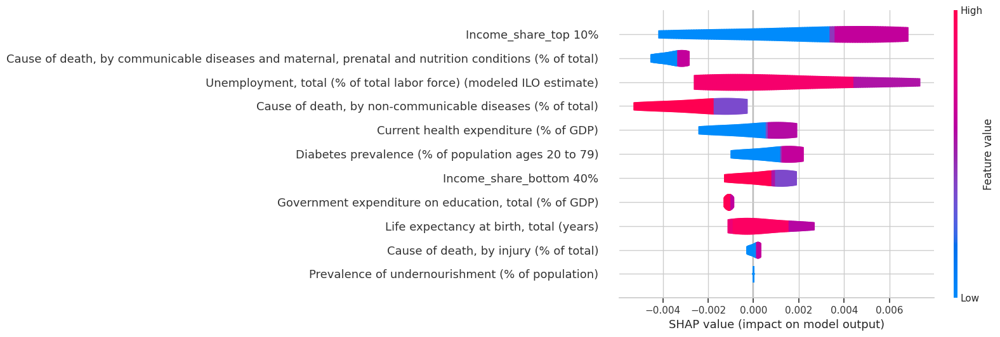


Top 5 SDoH for Asthma in Region = North America:
                                              Feature  Mean |SHAP|
5                                Income_share_top 10%     0.004280
0   Cause of death, by communicable diseases and m...     0.003502
10  Unemployment, total (% of total labor force) (...     0.002761
2   Cause of death, by non-communicable diseases (...     0.002204
3               Current health expenditure (% of GDP)     0.001420
SHAP summary (violin) for Kidney Disease in Region = South Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


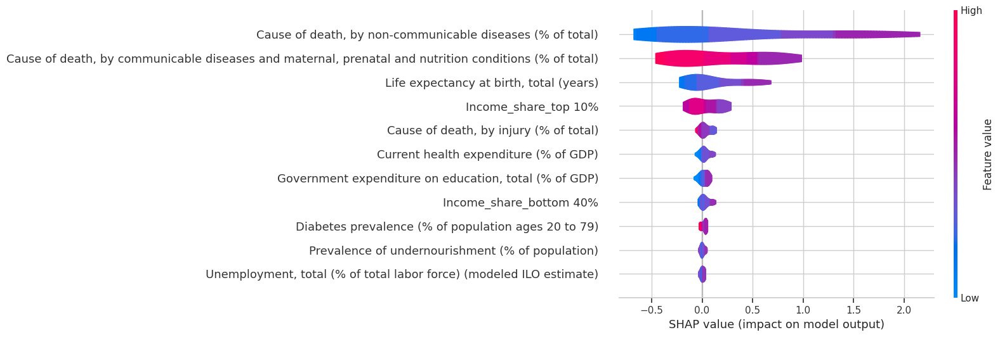


Top 5 SDoH for Kidney Disease in Region = South Asia:
                                             Feature  Mean |SHAP|
2  Cause of death, by non-communicable diseases (...     0.645641
0  Cause of death, by communicable diseases and m...     0.394295
8            Life expectancy at birth, total (years)     0.191047
5                               Income_share_top 10%     0.126223
1             Cause of death, by injury (% of total)     0.043547
SHAP summary (violin) for Kidney Disease in Region = Europe & Central Asia


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


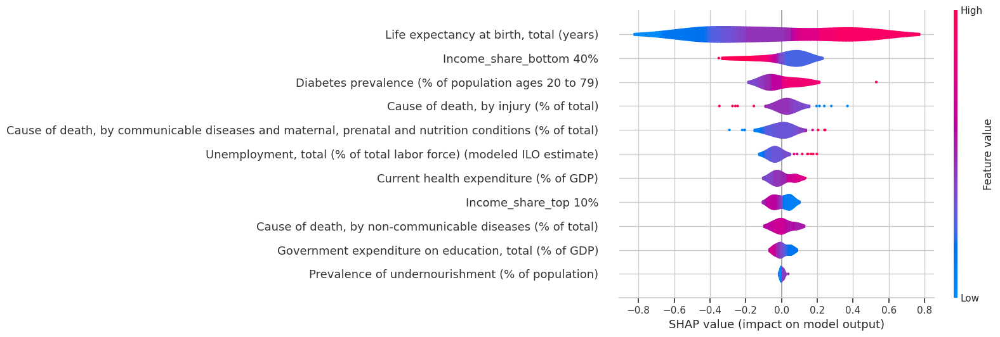


Top 5 SDoH for Kidney Disease in Region = Europe & Central Asia:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.324551
4                            Income_share_bottom 40%     0.111689
6  Diabetes prevalence (% of population ages 20 t...     0.086949
1             Cause of death, by injury (% of total)     0.074872
0  Cause of death, by communicable diseases and m...     0.068975
SHAP summary (violin) for Kidney Disease in Region = Middle East & North Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


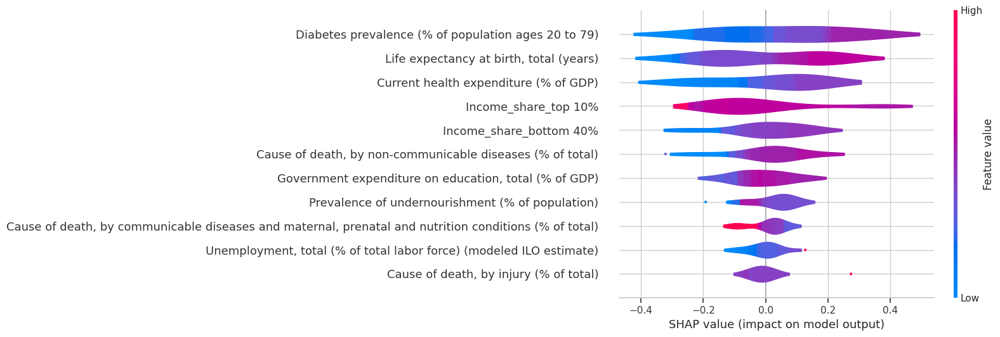


Top 5 SDoH for Kidney Disease in Region = Middle East & North Africa:
                                             Feature  Mean |SHAP|
6  Diabetes prevalence (% of population ages 20 t...     0.178058
8            Life expectancy at birth, total (years)     0.168363
3              Current health expenditure (% of GDP)     0.145330
5                               Income_share_top 10%     0.134510
4                            Income_share_bottom 40%     0.094457
SHAP summary (violin) for Kidney Disease in Region = Sub-Saharan Africa


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


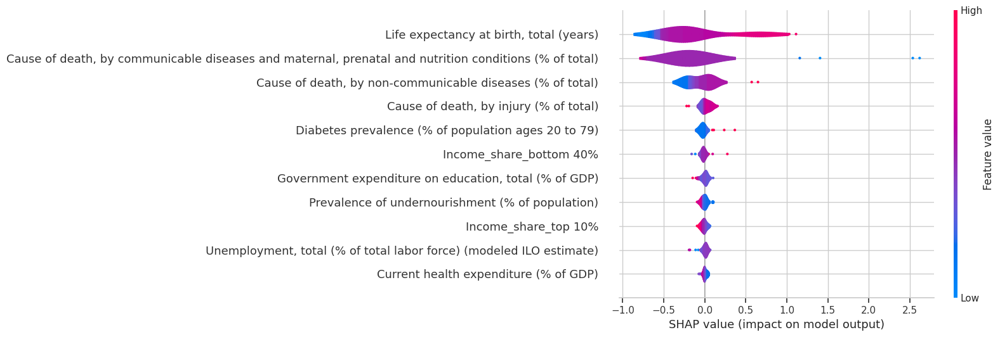


Top 5 SDoH for Kidney Disease in Region = Sub-Saharan Africa:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.397516
0  Cause of death, by communicable diseases and m...     0.334768
2  Cause of death, by non-communicable diseases (...     0.144340
1             Cause of death, by injury (% of total)     0.051167
6  Diabetes prevalence (% of population ages 20 t...     0.044944
SHAP summary (violin) for Kidney Disease in Region = Latin America & Caribbean


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


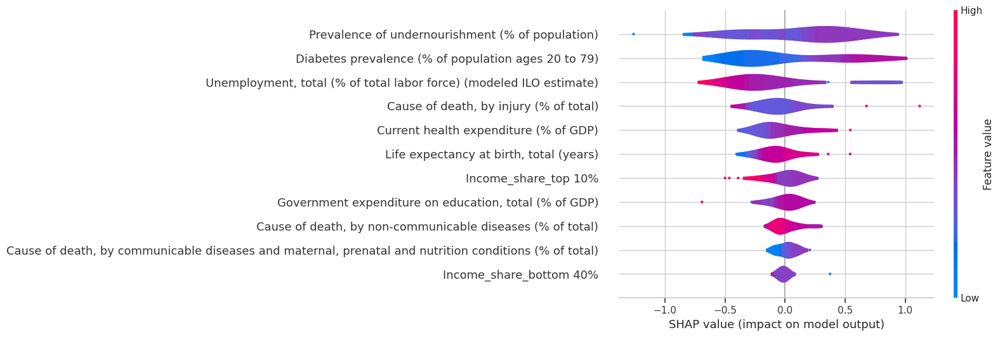


Top 5 SDoH for Kidney Disease in Region = Latin America & Caribbean:
                                              Feature  Mean |SHAP|
9    Prevalence of undernourishment (% of population)     0.399348
6   Diabetes prevalence (% of population ages 20 t...     0.386417
10  Unemployment, total (% of total labor force) (...     0.341402
1              Cause of death, by injury (% of total)     0.170983
3               Current health expenditure (% of GDP)     0.167740
SHAP summary (violin) for Kidney Disease in Region = East Asia & Pacific


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


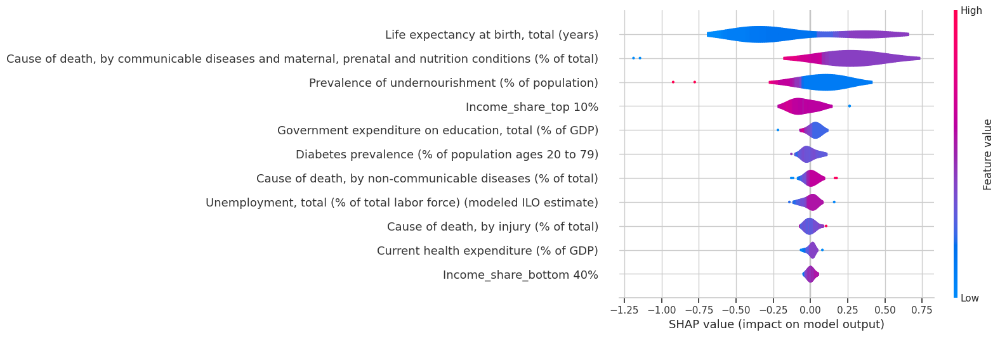


Top 5 SDoH for Kidney Disease in Region = East Asia & Pacific:
                                             Feature  Mean |SHAP|
8            Life expectancy at birth, total (years)     0.344574
0  Cause of death, by communicable diseases and m...     0.339156
9   Prevalence of undernourishment (% of population)     0.170225
5                               Income_share_top 10%     0.090318
7  Government expenditure on education, total (% ...     0.043690
SHAP summary (violin) for Kidney Disease in Region = North America


/usr/local/lib/python3.11/dist-packages/shap/plots/_beeswarm.py:1150: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


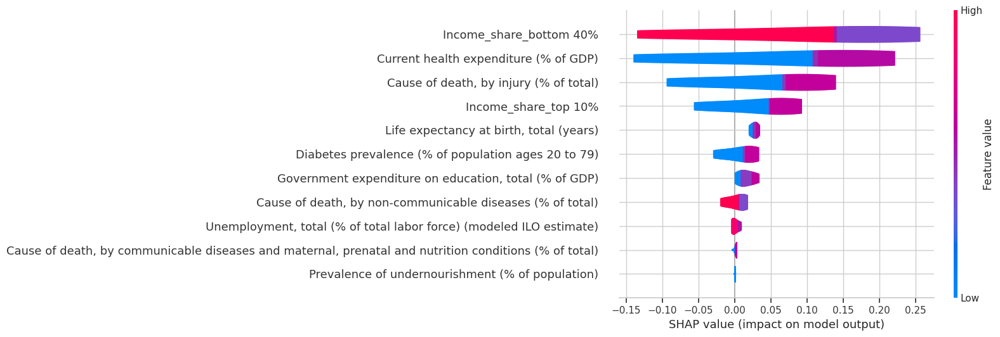


Top 5 SDoH for Kidney Disease in Region = North America:
                                   Feature  Mean |SHAP|
4                  Income_share_bottom 40%     0.157980
3    Current health expenditure (% of GDP)     0.139799
1   Cause of death, by injury (% of total)     0.088563
5                     Income_share_top 10%     0.057982
8  Life expectancy at birth, total (years)     0.026664


In [46]:
# Define the features
features = [
    'Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total)',
    'Cause of death, by injury (% of total)',
    'Cause of death, by non-communicable diseases (% of total)',
    'Current health expenditure (% of GDP)',
    'Income_share_bottom 40%',
    'Income_share_top 10%',
    'Diabetes prevalence (% of population ages 20 to 79)',
    'Government expenditure on education, total (% of GDP)',
    'Life expectancy at birth, total (years)',
    'Prevalence of undernourishment (% of population)',
    'Unemployment, total (% of total labor force) (modeled ILO estimate)'
]

# Disease targets
diseases = {
    'Diabetes': '%death by diabetes',
    'Cardiovascular Disease': '%death by cardiovascular_diseases',
    'Alzheimer’s Disease': '%death by alzheimer_and_other_dementia',
    'Asthma': '%death by asthma',
    'Kidney Disease': '%death by kidney_diseases'
}

# Run SHAP analysis by region
for disease_name, target_col in diseases.items():
    shap_analysis_by_group(
        df=df_new,
        group_col='Region',
        target_col=target_col,
        feature_cols=features,
        disease_name=disease_name
    )


/tmp/ipython-input-47-4257789213.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


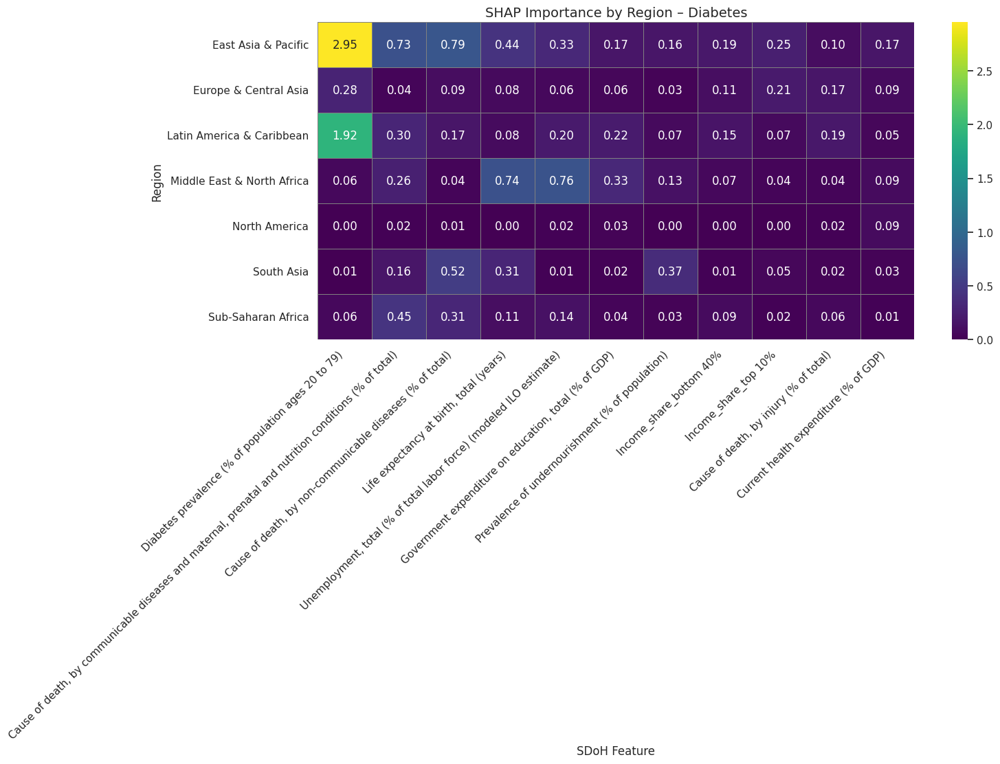

/tmp/ipython-input-47-4257789213.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


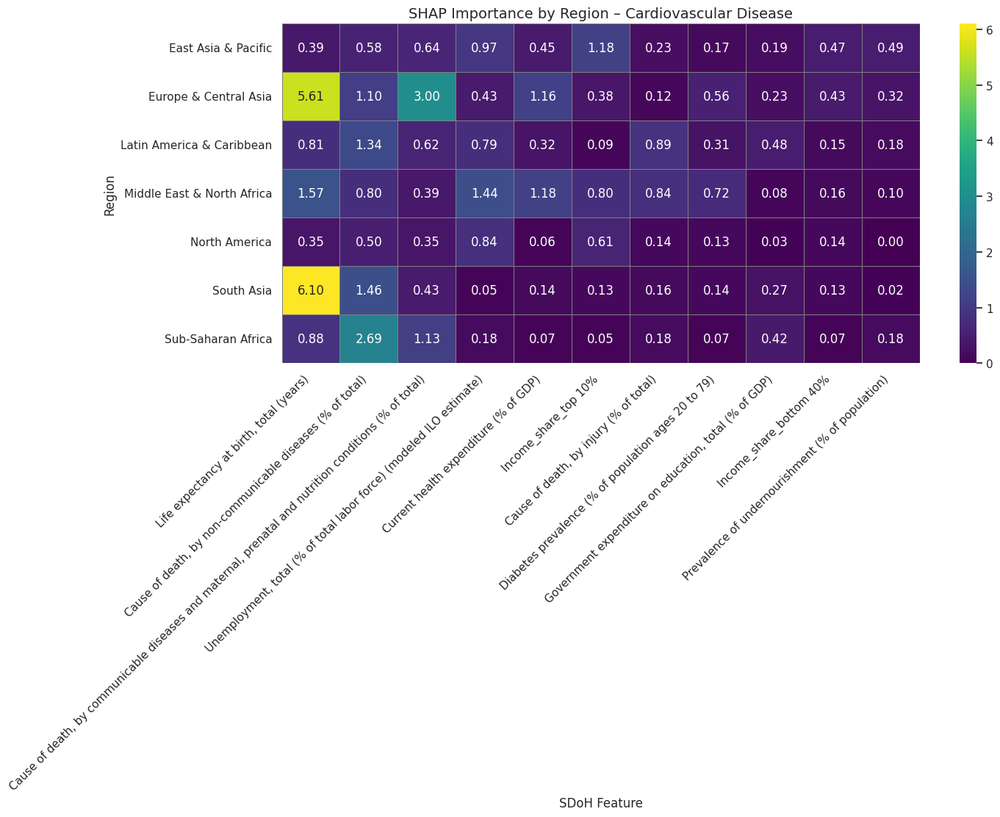

/tmp/ipython-input-47-4257789213.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


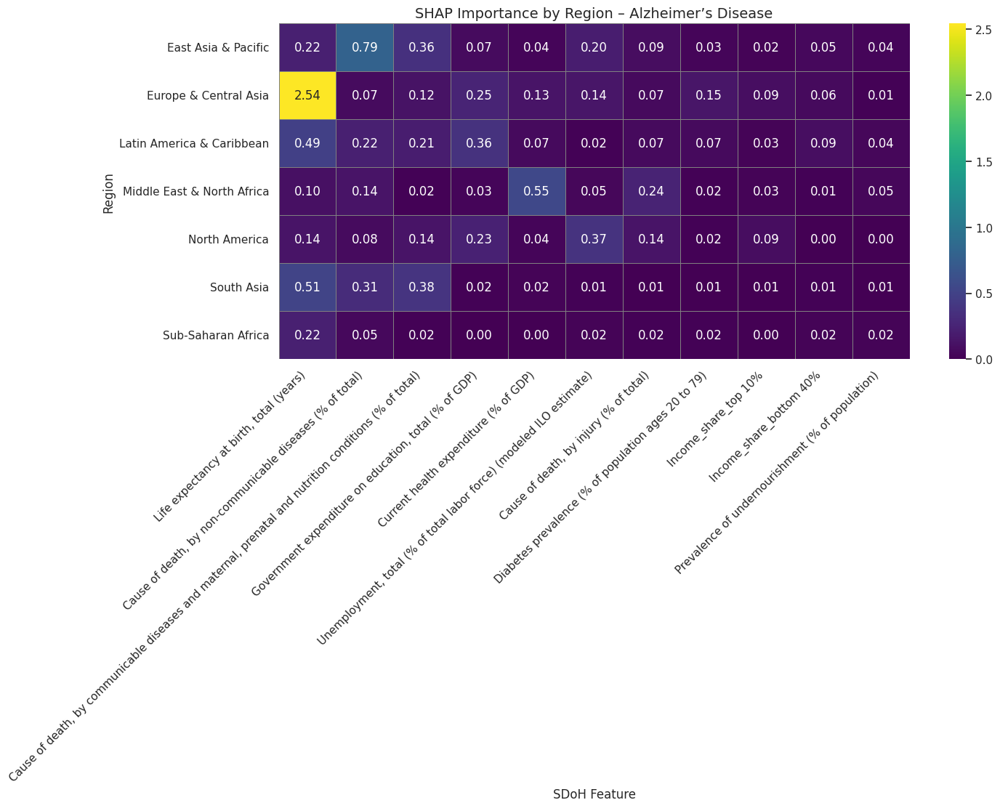

/tmp/ipython-input-47-4257789213.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


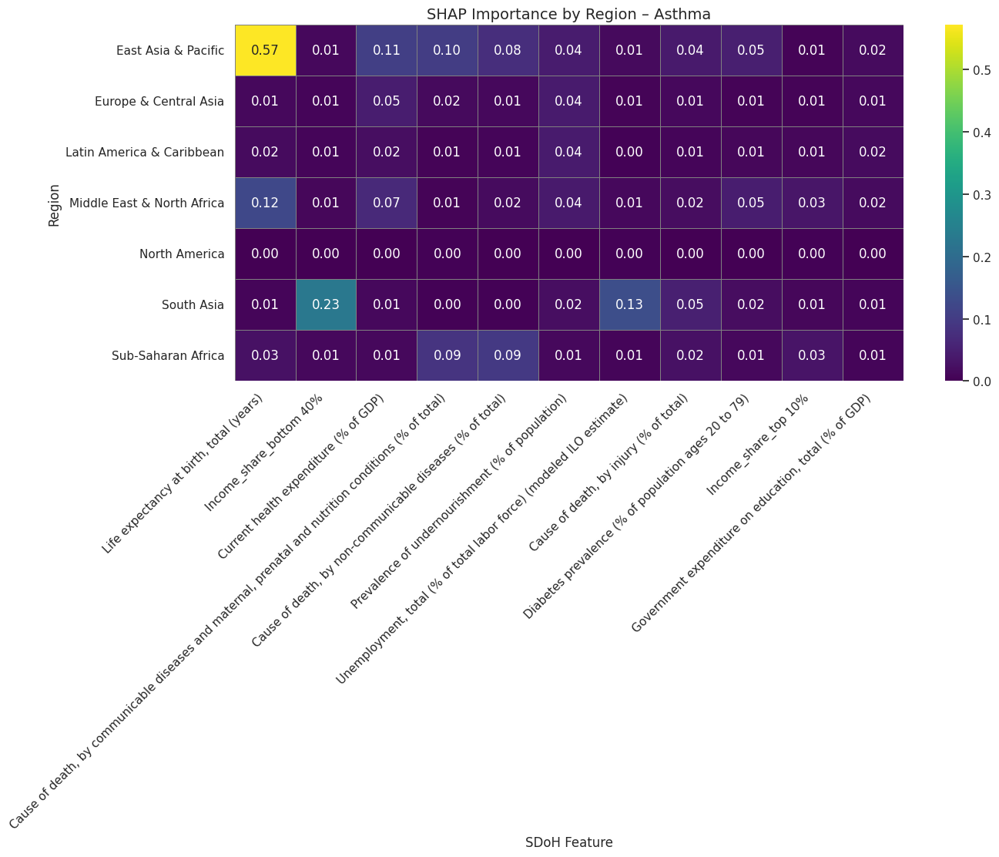

/tmp/ipython-input-47-4257789213.py:29: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


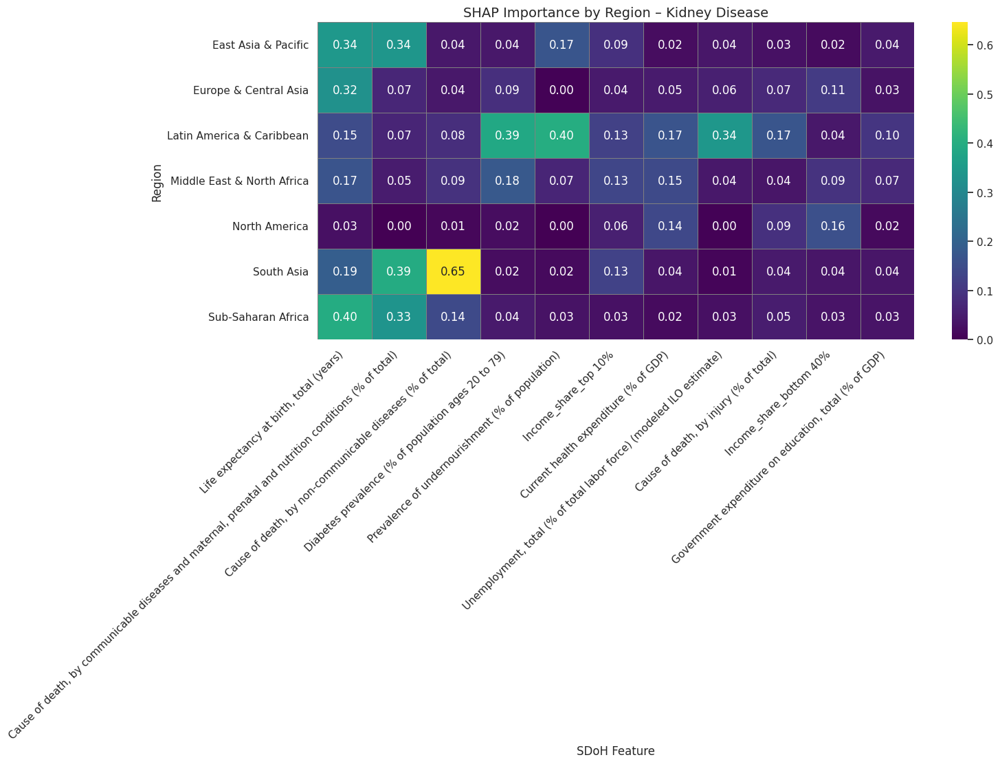

In [47]:
# Combine SHAP results
shap_df = pd.concat(all_results, ignore_index=True)

# Create a heatmap for each disease
for disease in shap_df['Disease'].unique():
    data = shap_df[shap_df['Disease'] == disease]

    # Pivot: rows = regions, columns = features
    heatmap_data = data.pivot(index='Group', columns='Feature', values='Mean |SHAP|')

    # Optional: reorder columns by average importance
    col_order = heatmap_data.mean().sort_values(ascending=False).index
    heatmap_data = heatmap_data[col_order]

    # Plot with a different color palette
    plt.figure(figsize=(14, 6))
    sns.heatmap(
        heatmap_data,
        cmap='viridis',
        annot=True,
        fmt=".2f",
        linewidths=0.5,
        linecolor='grey'
    )
    plt.title(f'SHAP Importance by Region – {disease}', fontsize=14)
    plt.ylabel('Region', fontsize=12)
    plt.xlabel('SDoH Feature', fontsize=12)
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
